### PROJECT TITLE: Network Analysis and Mining on E-commerce dataset with Session-Based Recommendation System

### TEAM NUMBER: 14

### TEAM DETAILS:

1. Abhishek Singhi (SRN: PES1UG20CS011, Section: A)
2. Amritha S Pallavoor (SRN: PES1UG20CS037, Section: A)
3. Ananya Nigam (SRN: PES1UG20CS044, Section: A)
4. Aniket Acharya (SRN: PES1UG20CS052, Section: A)

### Libraries Used:

1. pandas
2. numpy
3. seaborn
4. networkx
5. matplotlib
6. pylab
7. community
8. collections
9. bokeh


Components -
1. Data Processing
2. Network Analysis
3. Link Prediction
4. Community Detection
5. Basic Recommender System
6. Session Based Recommendation System




### Versions Details:



In [ ]:
import pandas as pd
import numpy as np
import networkx
import matplotlib
import seaborn
import pylab
import community
import collections
import bokeh


In [ ]:
print(networkx.__version__)
print(pd.__version__)
print(np.__version__)
print(matplotlib.__version__)
print(seaborn.__version__)
print(bokeh.__version__)




3.0
1.5.2
1.23.5
3.6.2
0.12.2
3.1.0


In [ ]:
pdf=pd.read_csv('products.csv')
cdf=pd.read_csv('copurchase.csv')

In [ ]:
pdf

,id,title,group,salesrank,review_cnt,downloads,rating
0,1,Patterns of Preaching: A Sermon Sampler,Book,396585.0,2,2,5.0
1,2,Candlemas: Feast of Flames,Book,168596.0,12,12,4.5
2,3,World War II Allied Fighter Planes Trading Cards,Book,1270652.0,1,1,5.0
3,4,Life Application Bible Commentary: 1 and 2 Tim...,Book,631289.0,1,1,4.0
4,5,Prayers That Avail Much for Business: Executive,Book,455160.0,0,0,0.0
...,...,...,...,...,...,...,...
259162,262104,Satchel Paige,Book,36449.0,3,3,4.5
259163,262106,Japanese for Busy People: English Teacher's Ma...,Book,588715.0,0,0,0.0
259164,262107,Halloween II,DVD,31245.0,320,320,4.0
259165,262108,Book Of Vision Quest,Book,255390.0,4,4,4.0


In [ ]:
pdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 259167 entries, 0 to 259166
Data columns (total 7 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   id          259167 non-null  int64  
 1   title       259167 non-null  object 
 2   group       259167 non-null  object 
 3   salesrank   259167 non-null  float64
 4   review_cnt  259167 non-null  int64  
 5   downloads   259167 non-null  int64  
 6   rating      259167 non-null  float64
dtypes: float64(2), int64(3), object(2)
memory usage: 13.8+ MB


In [ ]:
pdf.describe()

,id,salesrank,review_cnt,downloads,rating
count,259167.000000,2.591670e+05,259167.000000,259167.000000,259167.000000
mean,131018.343813,4.955061e+05,14.000895,13.750589,3.158454
std,75663.758316,5.750585e+05,72.878967,69.013924,2.019447
min,1.000000,-1.000000e+00,0.000000,0.000000,0.000000
25%,65489.500000,9.191100e+04,0.000000,0.000000,0.000000
50%,131007.000000,3.031550e+05,2.000000,2.000000,4.000000
75%,196511.500000,6.778710e+05,8.000000,7.000000,5.000000
max,262109.000000,3.793303e+06,5545.000000,4995.000000,5.000000


In [ ]:
pdf['group'].unique()

array(['Book', 'Music', 'DVD', 'Video', 'Toy', 'Video Games', 'Software',
       'Baby Product', 'CE'], dtype=object)

In [ ]:
new_pdf=pdf[pdf['group']=='Book']

In [ ]:
new_pdf

,id,title,group,salesrank,review_cnt,downloads,rating
0,1,Patterns of Preaching: A Sermon Sampler,Book,396585.0,2,2,5.0
1,2,Candlemas: Feast of Flames,Book,168596.0,12,12,4.5
2,3,World War II Allied Fighter Planes Trading Cards,Book,1270652.0,1,1,5.0
3,4,Life Application Bible Commentary: 1 and 2 Tim...,Book,631289.0,1,1,4.0
4,5,Prayers That Avail Much for Business: Executive,Book,455160.0,0,0,0.0
...,...,...,...,...,...,...,...
259160,262102,The Everything Homebuying Book: From Open Hous...,Book,664919.0,3,3,4.5
259162,262104,Satchel Paige,Book,36449.0,3,3,4.5
259163,262106,Japanese for Busy People: English Teacher's Ma...,Book,588715.0,0,0,0.0
259165,262108,Book Of Vision Quest,Book,255390.0,4,4,4.0


In [ ]:
new_pdf.group.unique()

array(['Book'], dtype=object)

In [ ]:
book_ids=pdf[pdf['group']=='Book']['id'].to_numpy()
book_ids

array([     1,      2,      3, ..., 262106, 262108, 262109], dtype=int64)

In [ ]:
non_book_ids=pdf[pdf['group']!='Book']['id'].to_numpy()
non_book_ids

array([     7,     14,     18, ..., 262101, 262103, 262107], dtype=int64)

In [ ]:
len(new_pdf)

188013

In [ ]:
len(pdf)

259167

In [ ]:
cdf

,Source,Target
0,1,2
1,1,4
2,1,5
3,1,15
4,2,11
...,...,...
1234865,262110,262099
1234866,262110,262100
1234867,262110,262101
1234868,262110,262106


In [ ]:
len(cdf)

1234870

In [ ]:
new_cdf=cdf[cdf.Source.isin(book_ids)]

In [ ]:
new_cdf=new_cdf[new_cdf.Target.isin(book_ids)]

In [ ]:
new_cdf

,Source,Target
0,1,2
1,1,4
2,1,5
3,1,15
4,2,11
...,...,...
1234859,262108,262109
1234860,262109,262076
1234861,262109,262097
1234863,262109,262099


In [ ]:
len(new_cdf)

637893

In [ ]:
new_cdf.Source.isin(book_ids).unique()

array([ True])

In [ ]:
new_cdf.Target.isin(book_ids).unique()

array([ True])

In [ ]:
# All the edges and nodes are related with BOOK

In [ ]:
# producing book related datasets
# new_pdf.to_csv('books_info.csv')
# new_cdf.to_csv('books_copurchase.csv')

In [ ]:
# no. of nodes
len(new_pdf)

188013

In [ ]:
# no. of edges
len(new_cdf)

637893

In [ ]:
in_degree=pd.DataFrame(new_cdf.groupby(['Target'])['Source'].size()).reset_index()
in_degree.columns=['id','in_degree']

out_degree=pd.DataFrame(new_cdf.groupby(['Source'])['Target'].size()).reset_index()
out_degree.columns=['id','out_degree']

all_degree=pd.merge(in_degree,out_degree,on='id',how='outer')
all_degree[np.isnan(all_degree)]=0

all_degree['all_degree']=(all_degree.in_degree+all_degree.out_degree)

all_degree=all_degree.sort_values('all_degree',ascending=False)

all_degree

,id,in_degree,out_degree,all_degree
10063,14949,309.0,3.0,312.0
3087,4429,278.0,3.0,281.0
25,33,262.0,4.0,266.0
8624,12771,240.0,3.0,243.0
4,8,201.0,3.0,204.0
...,...,...,...,...
179775,144940,0.0,1.0,1.0
154841,230770,1.0,0.0,1.0
111772,164783,1.0,0.0,1.0
12185,18013,1.0,0.0,1.0


In [ ]:
# len(all_degree)

In [ ]:
# node with highest all_degree
new_pdf[new_pdf['id']==14849]

,id,title,group,salesrank,review_cnt,downloads,rating
14707,14849,McCoy Pottery: Reference & Value Guide (McCoy ...,Book,159827.0,11,11,4.5


------------------------------------------ 


In [ ]:
# importing the necessary modules
import pandas as pd
import numpy as np
import seaborn as sns
sns.set()

In [ ]:
# loading and accessing the data
book_link=pd.read_csv('books_copurchase.csv')

In [ ]:
pdf.columns

Index(['id', 'title', 'group', 'salesrank', 'review_cnt', 'downloads',
       'rating'],
      dtype='object')

## Univariate & Multivariate analysis of Features

<AxesSubplot: xlabel='salesrank', ylabel='Count'>

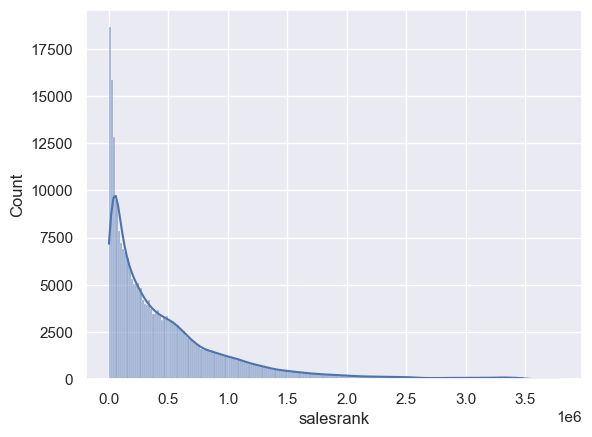

In [ ]:
# distribution of sales of products
sns.histplot(pdf['salesrank'], kde=True)

<AxesSubplot: xlabel='salesrank', ylabel='Count'>

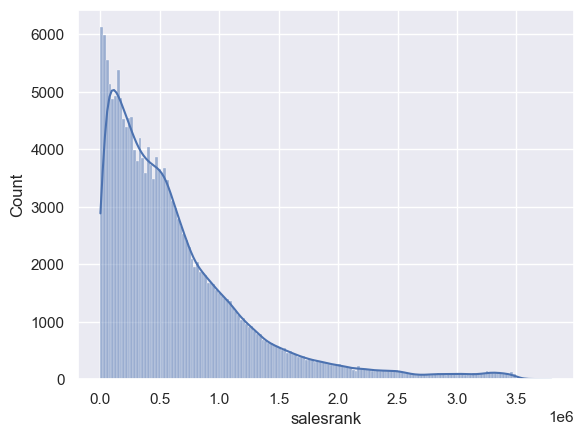

In [ ]:
# distribution of sales of Books
sns.histplot(pdf[pdf.group == 'Book']['salesrank'], kde=True)

<AxesSubplot: xlabel='group', ylabel='Count'>

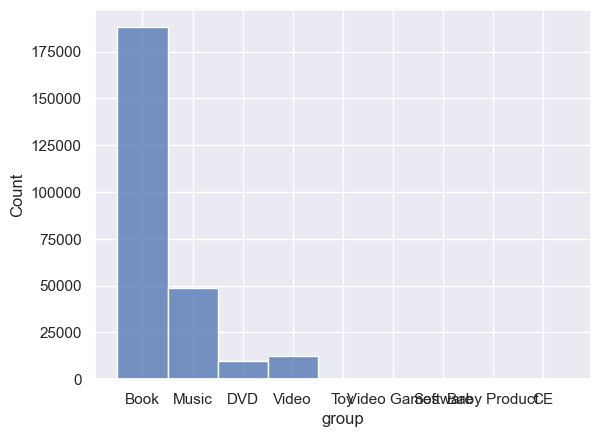

In [ ]:
# categorical number of products present 
sns.histplot(pdf['group'])

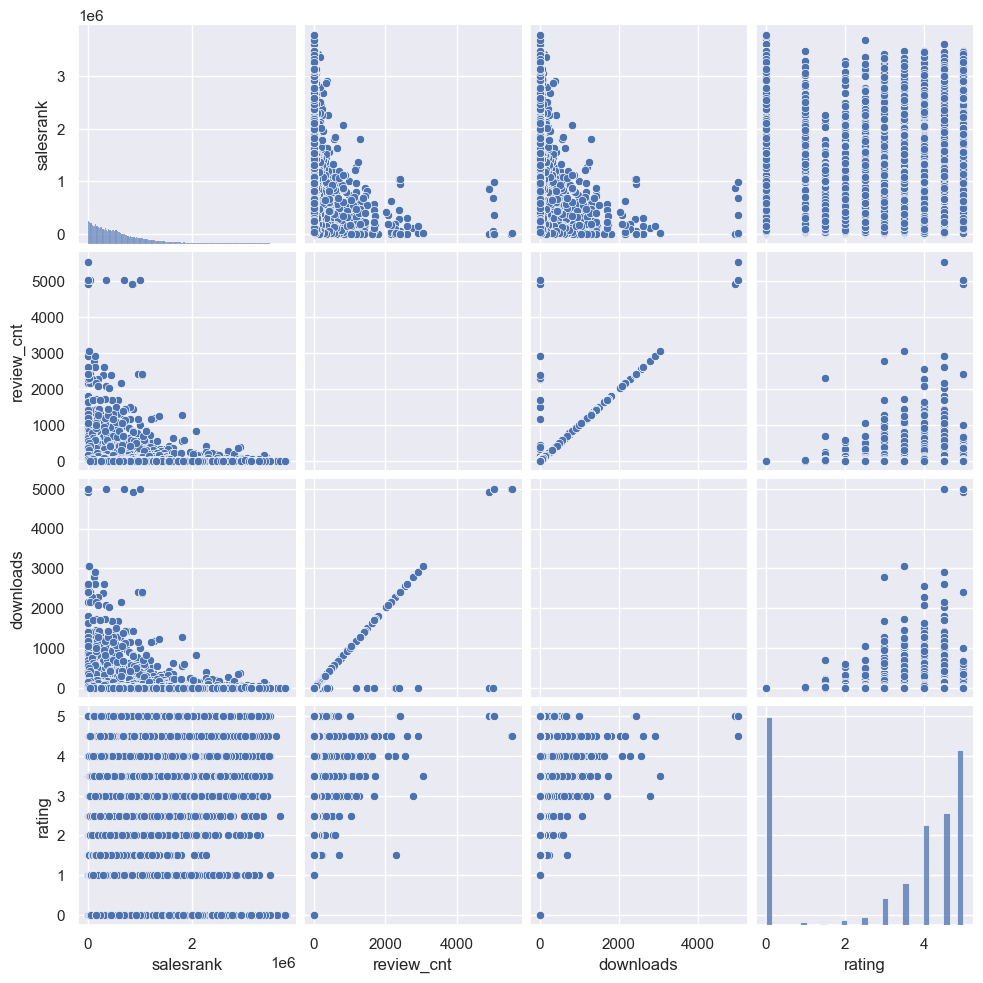

In [ ]:
# correlation between features to understand relationship 
sns.pairplot(data=pdf[pdf.group == 'Book'][["salesrank", "review_cnt","downloads","rating"]])

In [ ]:
cdf.columns

Index(['Source', 'Target'], dtype='object')

<AxesSubplot: xlabel='Source', ylabel='Target'>

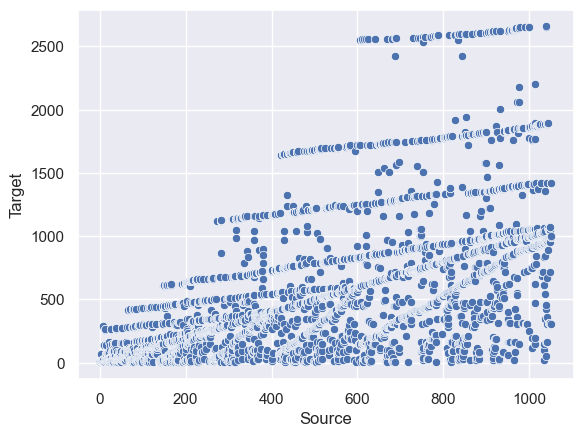

In [ ]:
# edge relationships of first 5000 records
sns.scatterplot(x='Source', y='Target', data=cdf.head(5000))

<AxesSubplot: xlabel='Source', ylabel='Target'>

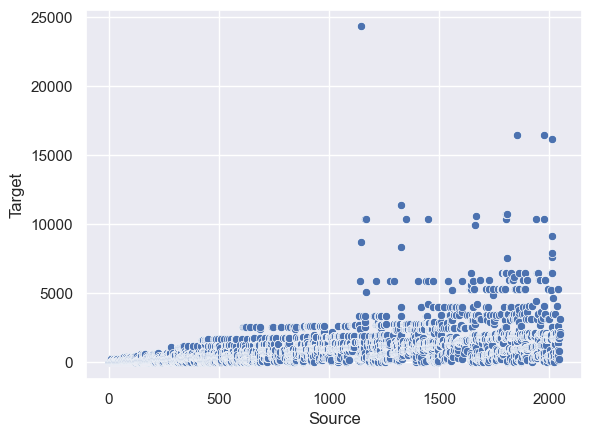

In [ ]:
# relationships of first 5000 book edge records 
sns.scatterplot(x='Source', y='Target', data=book_link.head(5000))

NETWORK ANALYSIS
------------------

-------------------------------------------

In [ ]:
import pandas as pd
import numpy as np

df=pd.DataFrame(pd.read_csv('products.csv'))
df.head()

,id,title,group,salesrank,review_cnt,downloads,rating
0,1,Patterns of Preaching: A Sermon Sampler,Book,396585.0,2,2,5.0
1,2,Candlemas: Feast of Flames,Book,168596.0,12,12,4.5
2,3,World War II Allied Fighter Planes Trading Cards,Book,1270652.0,1,1,5.0
3,4,Life Application Bible Commentary: 1 and 2 Tim...,Book,631289.0,1,1,4.0
4,5,Prayers That Avail Much for Business: Executive,Book,455160.0,0,0,0.0


In [ ]:
df_filter=df[(df['group']=='Book')&((df['salesrank']<=150000)&(df['salesrank']>-1))]

df_cop=pd.DataFrame(pd.read_csv('copurchase.csv'))
df_cop_book=df_cop[df_cop.Source.isin(df_filter.id) & df_cop.Target.isin(df_filter.id)]
in_degree=df_cop_book.groupby(['Target'])['Source'].size().reset_index(name='in_degree')
out_degree=df_cop_book.groupby(['Source'])['Target'].size().reset_index(name='out_degree')

x = out_degree.set_index('Source')
y = in_degree.set_index('Target').rename_axis('Source')
y.columns = x.columns

combined=y.add(x, fill_value=0).loc[y.index, :].reset_index()
df_filter.head()
combined.nlargest(5,'out_degree') #Top 5 products with highest in+out degree
#2 products (33 and 4429) with highest degree.

,Source,out_degree
1,33,53.0
360,4429,53.0
23,244,36.0
32,302,22.0
471,5913,22.0


In [ ]:
#grouping by source and target products to see if any particular combination has been repeated. 
#We'll use this dataset to build the network graph
df_final_group=df_cop_book.groupby(['Source','Target']).size().reset_index(name='Freq')
df_final_group.head()

,Source,Target,Freq
0,12,261,1
1,74,282,1
2,77,422,1
3,79,82,1
4,117,131,1


The product with the highest degree (in degree + out degree) are 33 and 4429. We’re interested in the sub component off all the products that are directly or indirectly associated with products 33 and 4429. The nodes 33 and 4429 and all its subcomponents were visualized by using a package Networkx. In the graph, larger the size of node, larger the degree for the node and darker color means larger degree. The degree of all nodes varies from 1-53. (A clear picture is attached with the assignment).

In [ ]:
import networkx as nx

In [ ]:
nx.__version__

'3.0'

In [ ]:
%matplotlib inline
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
import pylab
from matplotlib.pyplot import subplots

#### Statistics from the graph:
**Degree of the Nodes:**<br/>  We can see that the large number of nodes have lower degree (<10) while only few nodes have degree >10.

In [ ]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
import pylab
import community
from matplotlib.pyplot import subplots
%matplotlib inline

g = nx.from_pandas_edgelist(df_final_group, 'Source', 'Target', ['Freq'])#create_using=nx.Graph()

# fig, ax = subplots()
subnet = nx.node_connected_component(g, 4429)



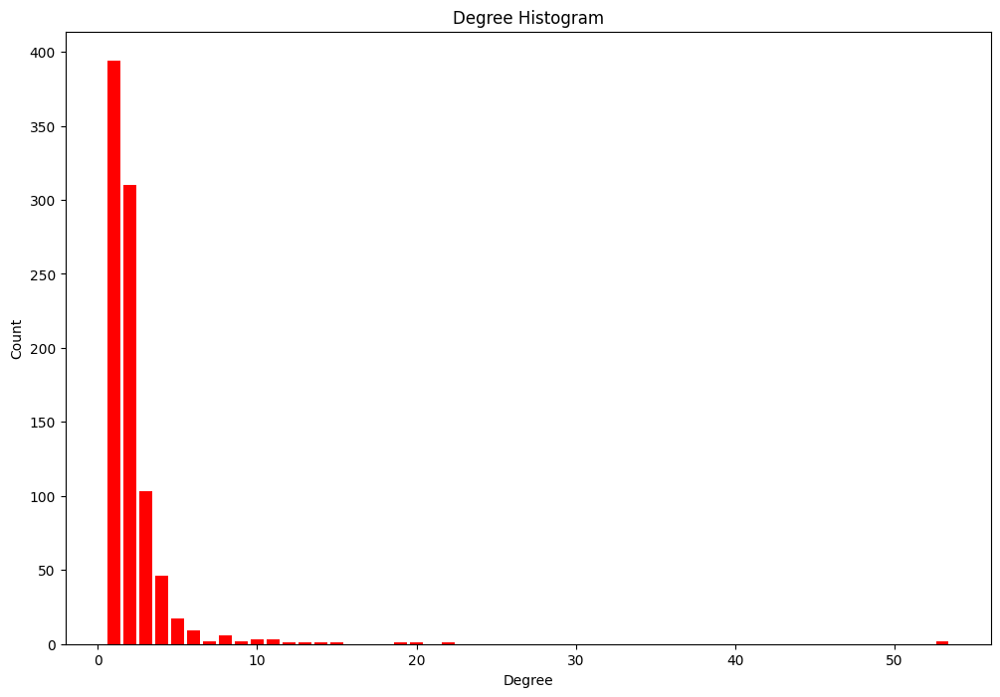

In [ ]:
## Degree Histogram for sub-component
import collections
from bokeh.io import show, output_file
from bokeh.plotting import figure
import seaborn as sns
degree_sequence = sorted([d for n, d in g.subgraph(subnet).degree()], reverse=True)
degreeCount = collections.Counter(degree_sequence)
deg, cnt = zip(*degreeCount.items())

fig, ax = plt.subplots()
plt.bar(deg, cnt, width=0.8, color='r')
plt.title("Degree Histogram")
plt.ylabel("Count")
plt.xlabel("Degree")
fig = plt.gcf()
fig.set_size_inches(12,8)
plt.show()

In [ ]:
#Density of sub-component
density_sc=nx.density(g.subgraph(subnet))
density_sc
#Low value of density means less dense the nodes are and little collectiveness between the nodes. 

0.0024622938288301533

#### Degree Centrality of the Nodes:

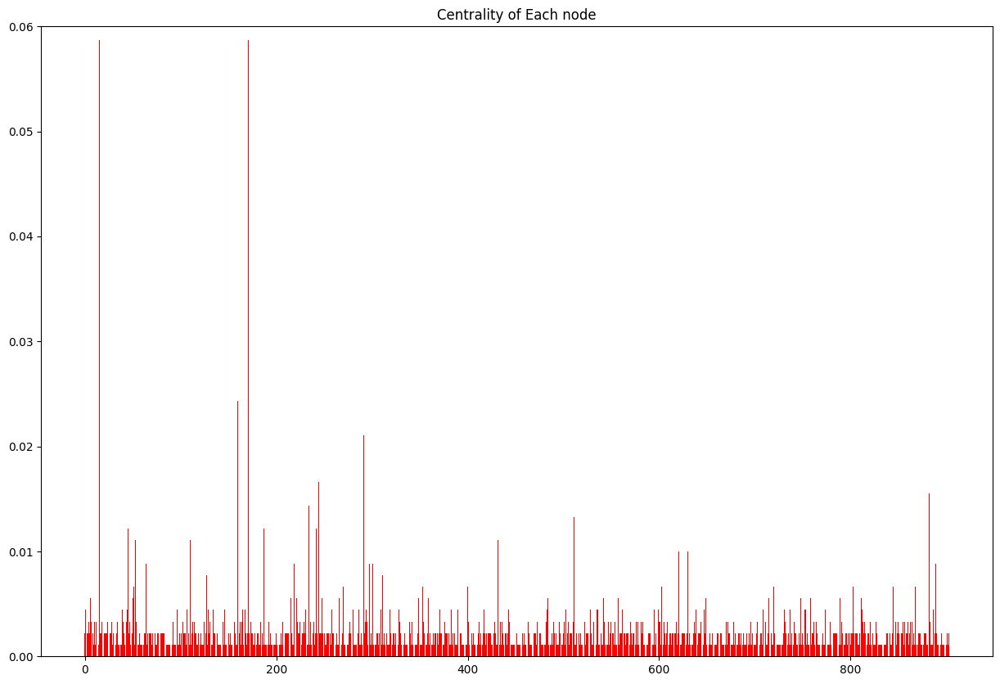

In [ ]:
#Centrality of the Nodes.
degree_central=nx.degree_centrality(g.subgraph(subnet))
plt.bar(range(len(degree_central)), list(degree_central.values()),width=0.8, color='r')
# plt.xticks(range(len(degree_central)), list(degree_central.keys()))
fig = plt.gcf()
axes=plt.gca()
fig.set_size_inches(15,10)
axes.set_ylim([0,0.06])
plt.title("Centrality of Each node")
plt.show()
#degree centrality=fraction of nodes it is connected to. 2 nodes have highest centrality

#### Closeness Centrality:
Closeness centrality is defined by is the average length of the shortest path between the node and all other nodes in the graph. Thus the more central a node is, the closer it is to all other nodes. For this particular subgraph, the closeness centrality looks similar for most of the nodes.

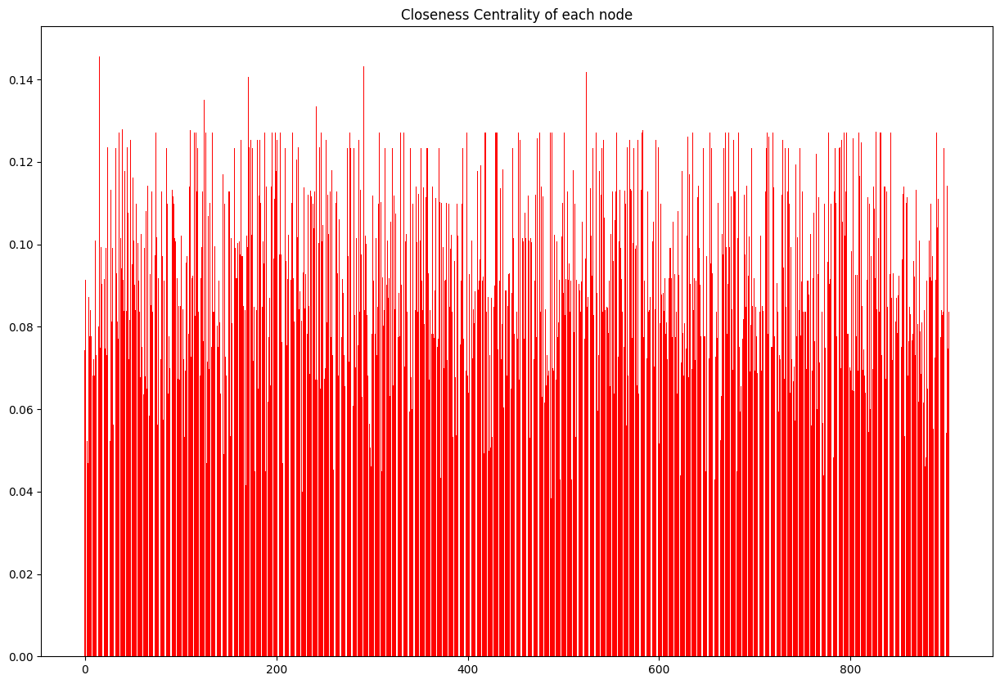

In [ ]:
#Closeness Centrality of the Nodes.
close_degree_central=nx.closeness_centrality(g.subgraph(subnet))
plt.bar(range(len(close_degree_central)), list(close_degree_central.values()),width=0.8, color='r')
# plt.xticks(range(len(degree_central)), list(degree_central.keys()))
fig = plt.gcf()
axes=plt.gca()
fig.set_size_inches(15,10)
plt.title("Closeness Centrality of each node")
plt.show()
#Closeness Centrality-Closeness centrality of a node u is the reciprocal of the
#average shortest path distance to u over all n-1 reachable nodes.

#### Betweenness Centrality:
Betweenness centrality aims to find the vertex of the given graph. Betweenness centrality quantifies the number of times a node acts as a bridge along the shortest path between two other nodes. Betweenness centrality of a node v is the sum of the fraction of all-pairs shortest paths that pass- through v. In the below graph, we can see that few nodes act as the bridge for other nodes to be connected.

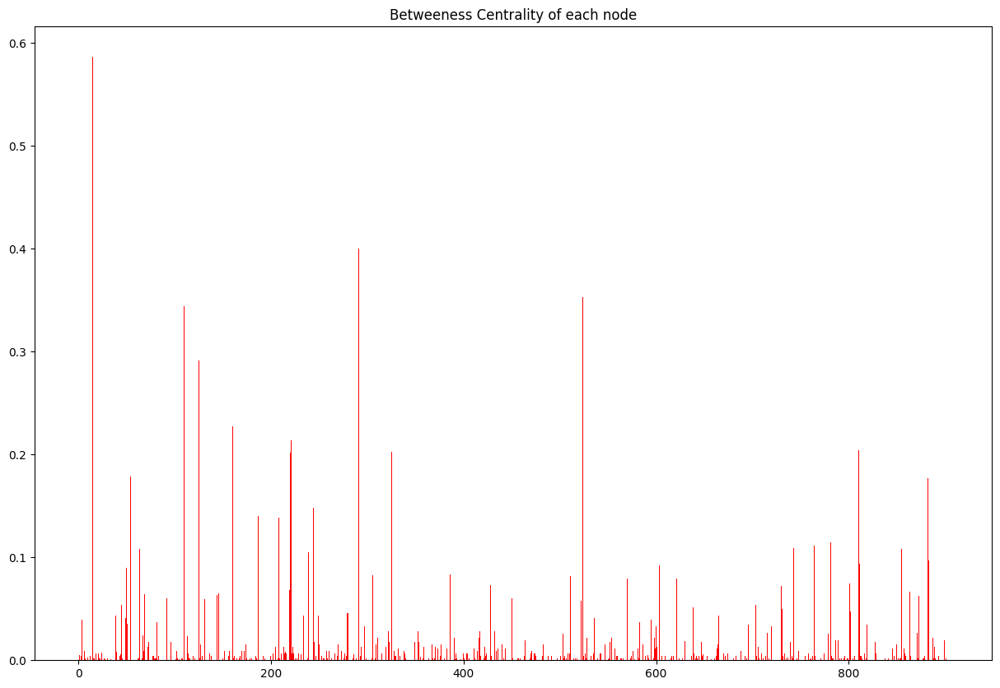

In [ ]:
#Between Centrality of the Nodes.
between_degree_central=nx.betweenness_centrality(g.subgraph(subnet))
plt.bar(range(len(between_degree_central)), list(between_degree_central.values()),width=0.8, color='r')
fig = plt.gcf()
axes=plt.gca()
fig.set_size_inches(15,10)
plt.title("Betweeness Centrality of each node")
plt.show()
#Between Centrality-Compute the shortest-path betweenness centrality for nodes.
#Betweenness centrality of a node v is the sum of the fraction of all-pairs shortest paths that pass through v

#### Eigen Vector Centrality:
Eigenvector centrality computes the centrality for a node based on the centrality of its neighbors. It is a relative scores to all nodes in the network based on the concept that connections to high-scoring nodes contribute more to the score of the node in question than equal connections to low-scoring nodes. In the subgraph, 2 nodes have high eigen vector score. Many other nodes have same score of 0.1, indicating that those nodes have similar in value.

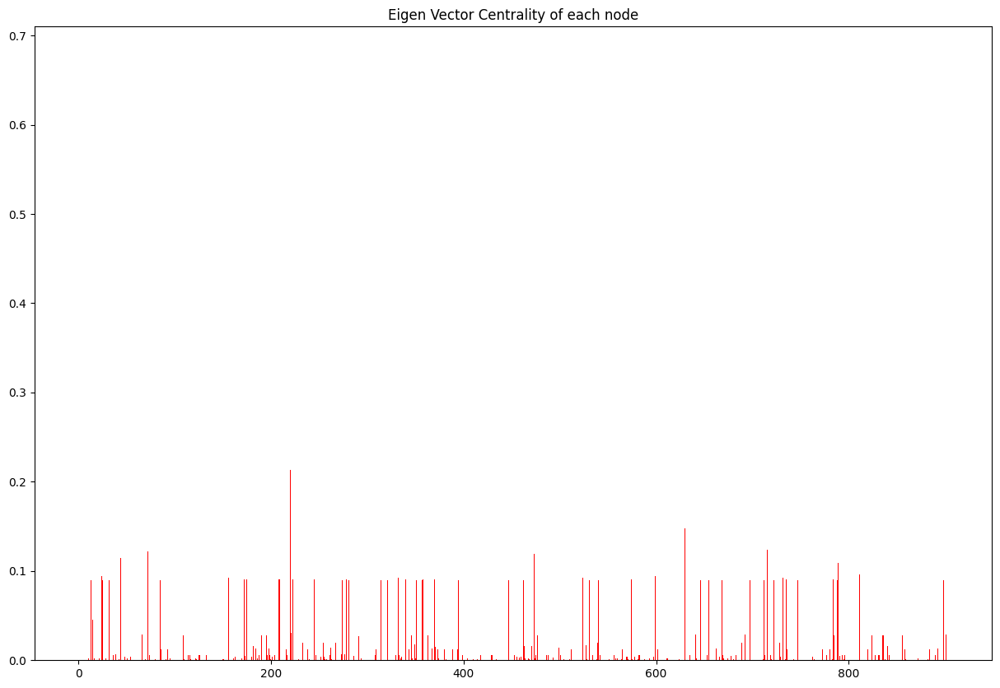

In [ ]:
#Eigen Value Centrality of the Nodes.
Eigen_central=nx.eigenvector_centrality_numpy(g.subgraph(subnet))
plt.bar(range(len(Eigen_central)), list(Eigen_central.values()),width=0.8, color='r')
fig = plt.gcf()
axes=plt.gca()
fig.set_size_inches(15,10)
plt.title("Eigen Vector Centrality of each node")
plt.show()
#Eigenvector centrality computes the centrality for a node based on the centrality of its neighbors. 
#The eigenvector centrality for node i is the i-th element of the vector xdefined by the equation

#### Hub and Authority Score:
Hub score estimates the nodes value based on outgoing links. The authority score indicates the node value based on incoming links. The hub score and Authority score of the subgraph is same for all nodes, indicating that the no of incoming and outgoing nodes are same.

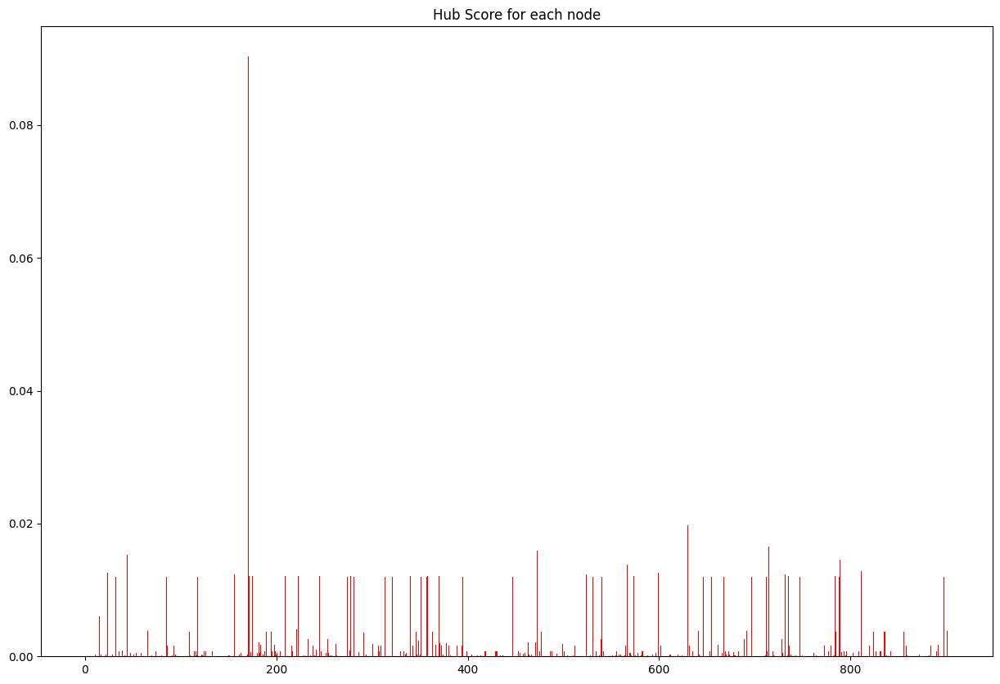

In [ ]:
#Hub Score of the Nodes.
hits_score=nx.hits(g.subgraph(subnet))
plt.bar(range(len(hits_score[0])), list(hits_score[0].values()),width=0.8, color='r')
fig = plt.gcf()
axes=plt.gca()
fig.set_size_inches(15,10)
plt.title("Hub Score for each node")
plt.show()
#Hub estimates the node value based on the Outgoing links.

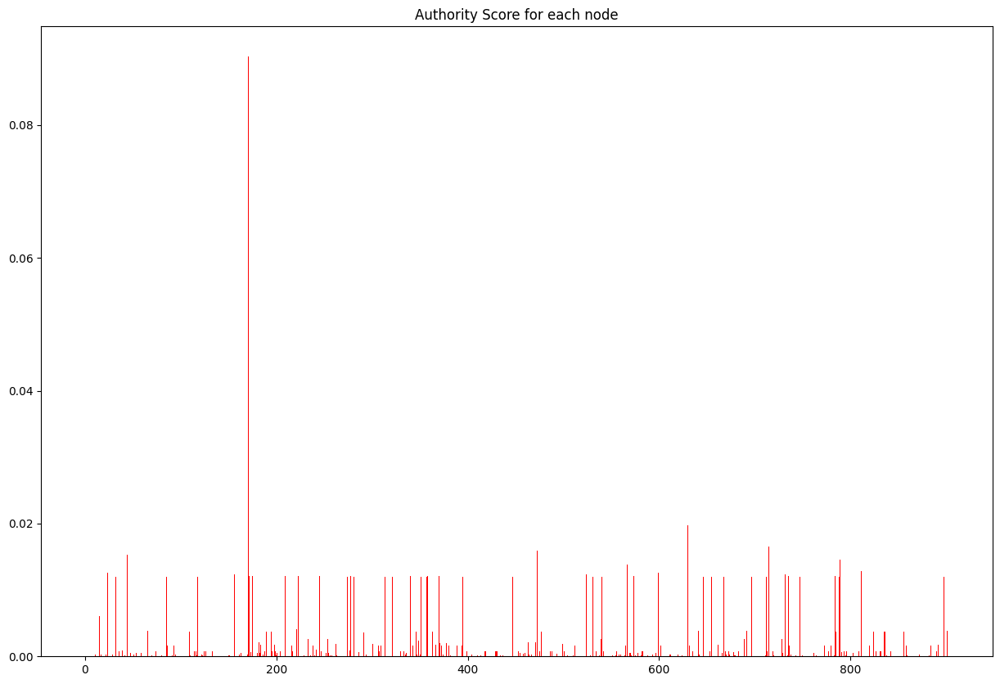

In [ ]:
#Authority Score of the Nodes.
hits_score=nx.hits(g.subgraph(subnet))
plt.bar(range(len(hits_score[1])), list(hits_score[1].values()),width=0.8, color='r')
fig = plt.gcf()
axes=plt.gca()
fig.set_size_inches(15,10)
plt.title("Authority Score for each node")
plt.show()
#Authorities estimates the node value based on the incoming links.

#### Average Degree Neighbor:
Average degree of neighbor indicates the average degree of the neighbor for a given node. This gives us a good indication of the degree of the neighboring nodes for a given node. In the below graph, we can see that nodes only connected to 33 or 4429 directly have average degree 53 but the dispersion of the average degree is high.

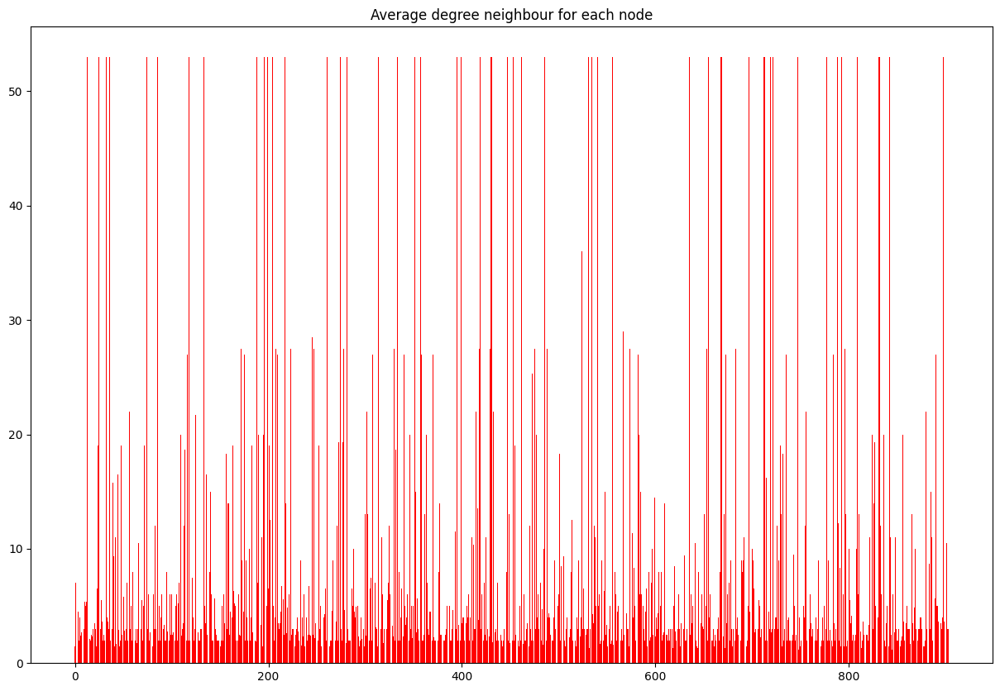

In [ ]:
#Average Degree Neighbour
degree_assort=nx.average_neighbor_degree(g.subgraph(subnet))
plt.bar(range(len(degree_assort)), list(degree_assort.values()),width=0.8, color='r')
fig = plt.gcf()
axes=plt.gca()
fig.set_size_inches(15,10)
plt.title("Average degree neighbour for each node")
plt.show()
#Returns the average degree of the neighborhood of each node.

#### Diameter of Network:
The shortest distance/path length between the two most distant connected nodes in the network (the
longest of all the calculated path lengths). In the subgraph, the diameter is 41.


In [ ]:
#Diameter of the network graph
nx.diameter(g.subgraph(subnet))
#The shortest distance/path length between the two most distant connected nodes in the 
#network ( = the longest of all the calculated path lengths).

41

#### Average Rating, Salesrank and Review Count for the nodes:
We calculated overall average for Rating, Salesrank and Review Count for the subgraph.


In [ ]:
filter_4429=df_final_group[(df_final_group['Source']==4429)|(df_final_group['Target']==4429)]
merged=pd.merge(filter_4429,df_filter,how='left', left_on=['Source'],right_on=['id'])
merged.loc[merged.id==4429,'title']='The Narcissistic Family : Diagnosis and Treatment'
merged.loc[merged.id==4429,'salesrank']=9727
merged.loc[merged.id==4429,'review_cnt']=19
merged.loc[merged.id==4429,'downloads']=19
merged.loc[merged.id==4429,'rating']=5.0
merged.loc[merged.id==4429,'id']=2501
merged[['rating','salesrank','review_cnt']].mean()

rating            3.632075
salesrank     75080.471698
review_cnt       22.037736
dtype: float64

In [ ]:
#Get the edges for each nodes from the network graph and store them in edges dataframe. From the initial table,
# we get the salesrank, rating and review detail for all the products. 
h=g.subgraph(subnet)
edges=pd.DataFrame(list(h.edges()))
edges=edges.rename(columns={'0':'Source','1':'Target'})

#total salesrank
df_cop_sales=pd.merge(edges,df_filter[['id','salesrank']],left_on=1,right_on='id',how='left')
df_cop_sales=df_cop_sales.rename(columns={'salesrank':'salesrank_target'})

df_cop_sale=pd.merge(edges,df_filter[['id','salesrank']],left_on=0,right_on='id',how='left')
df_cop_sale=df_cop_sale.rename(columns={'salesrank':'salesrank_source'})

df_cop_sale['salesrank_target']=df_cop_sales['salesrank_target']
df_source_sum=df_cop_sale.groupby(0)['salesrank_target'].sum().reset_index(name='Source_sum')
df_target_sum=df_cop_sale.groupby(1)['salesrank_source'].sum().reset_index(name='Target_sum')

x = df_source_sum.set_index(0)
y = df_target_sum.set_index(1).rename_axis(0)
y.columns = x.columns

combined=y.add(x, fill_value=0)
combined=pd.DataFrame(combined)
combined=combined.rename(columns={'0':'id','Source_sum':'Total_salesrank'})
combined.head()

,Total_salesrank
0,
33,4354123.0
77,125232.0
78,804969.0
130,159895.0
148,60293.0


In [ ]:
#Total rating
df_cop_rating=pd.merge(edges,df_filter[['id','rating']],left_on=1,right_on='id',how='left')
df_cop_rating=df_cop_rating.rename(columns={'rating':'rating_target'})

df_cop_rate=pd.merge(edges,df_filter[['id','rating']],left_on=0,right_on='id',how='left')
df_cop_rate=df_cop_rate.rename(columns={'rating':'rating_source'})
df_cop_rate['rating_target']=df_cop_rating['rating_target']

df_source_rate_sum=df_cop_rate.groupby(0)['rating_target'].sum().reset_index(name='Source_sum')
df_target_rate_sum=df_cop_rate.groupby(1)['rating_source'].sum().reset_index(name='Target_sum')

x = df_source_rate_sum.set_index(0)
y = df_target_rate_sum.set_index(1).rename_axis(0)
y.columns = x.columns

combined_rating=y.add(x, fill_value=0)
combined_rating=pd.DataFrame(combined_rating)
combined_rating=combined_rating.rename(columns={'0':'id','Source_sum':'Total_rating'})
combined_rating.head()

,Total_rating
0,
33,217.5
77,14.0
78,49.5
130,9.0
148,4.5


In [ ]:
#Total review count
df_cop_reviews=pd.merge(edges,df_filter[['id','review_cnt']],left_on=1,right_on='id',how='left')
df_cop_reviews=df_cop_reviews.rename(columns={'review_cnt':'review_cnt_target'})

df_cop_review=pd.merge(edges,df_filter[['id','review_cnt']],left_on=0,right_on='id',how='left')
df_cop_review=df_cop_review.rename(columns={'review_cnt':'review_cnt_source'})
df_cop_review['review_cnt_target']=df_cop_reviews['review_cnt_target']

df_source_review_sum=df_cop_review.groupby(0)['review_cnt_target'].sum().reset_index(name='Source_sum')
df_source_reviews_sum=df_cop_review.groupby(1)['review_cnt_source'].sum().reset_index(name='Target_sum')

x = df_source_review_sum.set_index(0)
y = df_source_reviews_sum.set_index(1).rename_axis(0)
y.columns = x.columns

combined_reviews=y.add(x, fill_value=0)
combined_reviews=pd.DataFrame(combined_reviews)
combined_reviews=combined_reviews.rename(columns={'0':'id','Source_sum':'Total_review_cnt'})
combined_reviews.head()

,Total_review_cnt
0,
33,1117.0
77,12.0
78,1736.0
130,9.0
148,14.0


#### Average salesrank, rating and review count: 


In [ ]:
degrees=pd.DataFrame(list(h.degree()))
degrees=degrees.sort_values(0)
degrees.head()

,0,1
15,33,53
47,77,3
45,78,11
73,130,2
83,148,2


In [ ]:
df_merge_sales=pd.merge(combined,degrees,left_on=0,right_on=0,how='left')
df_merge_sales['Average_Salesrank']=df_merge_sales['Total_salesrank']/df_merge_sales[1]
df_merge_sales=df_merge_sales.rename(columns={'key_0':'id',1:'Degree'})
df_merge_sales.head()

,id,Total_salesrank,Degree,Average_Salesrank
0,33,4354123.0,53,82153.264151
1,77,125232.0,3,41744.000000
2,78,804969.0,11,73179.000000
3,130,159895.0,2,79947.500000
4,148,60293.0,2,30146.500000


In [ ]:
df_merge_rating=pd.merge(combined_rating,degrees,left_on=0,right_on=0,how='left')
df_merge_rating['Average_Rating']=df_merge_rating['Total_rating']/df_merge_rating[1]
df_merge_rating=df_merge_rating.rename(columns={'key_0':'id',1:'Degree'})
df_merge_rating.head()

,id,Total_rating,Degree,Average_Rating
0,33,217.5,53,4.103774
1,77,14.0,3,4.666667
2,78,49.5,11,4.500000
3,130,9.0,2,4.500000
4,148,4.5,2,2.250000


In [ ]:
df_merge_reviews=pd.merge(combined_reviews,degrees,left_on=0,right_on=0,how='left')
df_merge_reviews['Average_Reviews']=df_merge_reviews['Total_review_cnt']/df_merge_reviews[1]
df_merge_reviews=df_merge_reviews.rename(columns={'key_0':'id',1:'Degree'})
df_merge_reviews.head()

,id,Total_review_cnt,Degree,Average_Reviews
0,33,1117.0,53,21.075472
1,77,12.0,3,4.000000
2,78,1736.0,11,157.818182
3,130,9.0,2,4.500000
4,148,14.0,2,7.000000


#### Network Graph parameters:
From the network graph, we're finding each parameters for each node and adding them to the dataframe.

In [ ]:
centrality_df=pd.DataFrame(degree_central.items(),columns=['id','centrality'])
degree_df=pd.DataFrame(degrees.items(),columns=['id','degree'])
closeness_central_df=pd.DataFrame(close_degree_central.items(),columns=['id','closeness_centrality'])
between_degree_df=pd.DataFrame(between_degree_central.items(),columns=['id','between_centrality'])
Eigen_central_df=pd.DataFrame(Eigen_central.items(),columns=['id','eigen_centrality'])
hubs_score_df=pd.DataFrame(hits_score[0].items(),columns=['id','hub_score'])
authority_score_df=pd.DataFrame(hits_score[1].items(),columns=['id','authority_score'])
avg_degree_neighbour_df=pd.DataFrame(degree_assort.items(),columns=['id','avg_degree_neighbour'])
centrality_df.head()
#filter purchase dataset

,id,centrality
0,24578,0.002215
1,4099,0.004430
2,141316,0.002215
3,184324,0.002215
4,2057,0.003322


In [ ]:
from IPython.display import display

# display centrality_df
display(centrality_df)

# display degree_df
display(degree_df)

# display closeness_central_df
display(closeness_central_df)

# display between_degree_df
display(between_degree_df)

# display Eigen_central_df
display(Eigen_central_df)

# display hubs_score_df
display(hubs_score_df)

# display authority_score_df
display(authority_score_df)

# display avg_degree_neighbour_df
display(avg_degree_neighbour_df)


,id,centrality
0,24578,0.002215
1,4099,0.004430
2,141316,0.002215
3,184324,0.002215
4,2057,0.003322
...,...,...
899,59377,0.003322
900,114676,0.001107
901,233465,0.002215
902,253947,0.001107


,id,degree
0,0,15 33 47 77 45 78 73 ...
1,1,15 53 47 3 45 11 73 2 83 ...


,id,closeness_centrality
0,24578,0.074266
1,4099,0.091332
2,141316,0.052336
3,184324,0.046955
4,2057,0.087171
...,...,...
899,59377,0.091918
900,114676,0.054221
901,233465,0.114130
902,253947,0.074677


,id,between_centrality
0,24578,0.002215
1,4099,0.004811
2,141316,0.000000
3,184324,0.004011
4,2057,0.039157
...,...,...
899,59377,0.019806
900,114676,0.000000
901,233465,0.002215
902,253947,0.000000


,id,eigen_centrality
0,24578,1.582148e-08
1,4099,4.811977e-05
2,141316,1.435753e-13
3,184324,3.946561e-14
4,2057,3.573739e-07
...,...,...
899,59377,2.876896e-04
900,114676,1.453603e-11
901,233465,2.866966e-02
902,253947,4.459363e-08


,id,hub_score
0,24578,2.113410e-09
1,4099,6.427768e-06
2,141316,1.917621e-14
3,184324,5.269020e-15
4,2057,4.773748e-08
...,...,...
899,59377,3.842915e-05
900,114676,1.941701e-12
901,233465,3.829651e-03
902,253947,5.956751e-09


,id,authority_score
0,24578,2.113410e-09
1,4099,6.427768e-06
2,141316,1.917626e-14
3,184324,5.269504e-15
4,2057,4.773748e-08
...,...,...
899,59377,3.842915e-05
900,114676,1.941701e-12
901,233465,3.829651e-03
902,253947,5.956751e-09


,id,avg_degree_neighbour
0,24578,1.500000
1,4099,7.000000
2,141316,3.000000
3,184324,4.500000
4,2057,2.000000
...,...,...
899,59377,3.666667
900,114676,2.000000
901,233465,10.500000
902,253947,3.000000


------------------------------------------------------------------------------------------------------------------------------

### LINK PREDICTION

## Reading Dataset and Visualizing Network Graph

In [ ]:
# importing required modules
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn import svm
from sklearn.metrics import classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report

In [ ]:
# reading and loading the dataset
Dataset = pd.read_csv('Final_Network.csv')

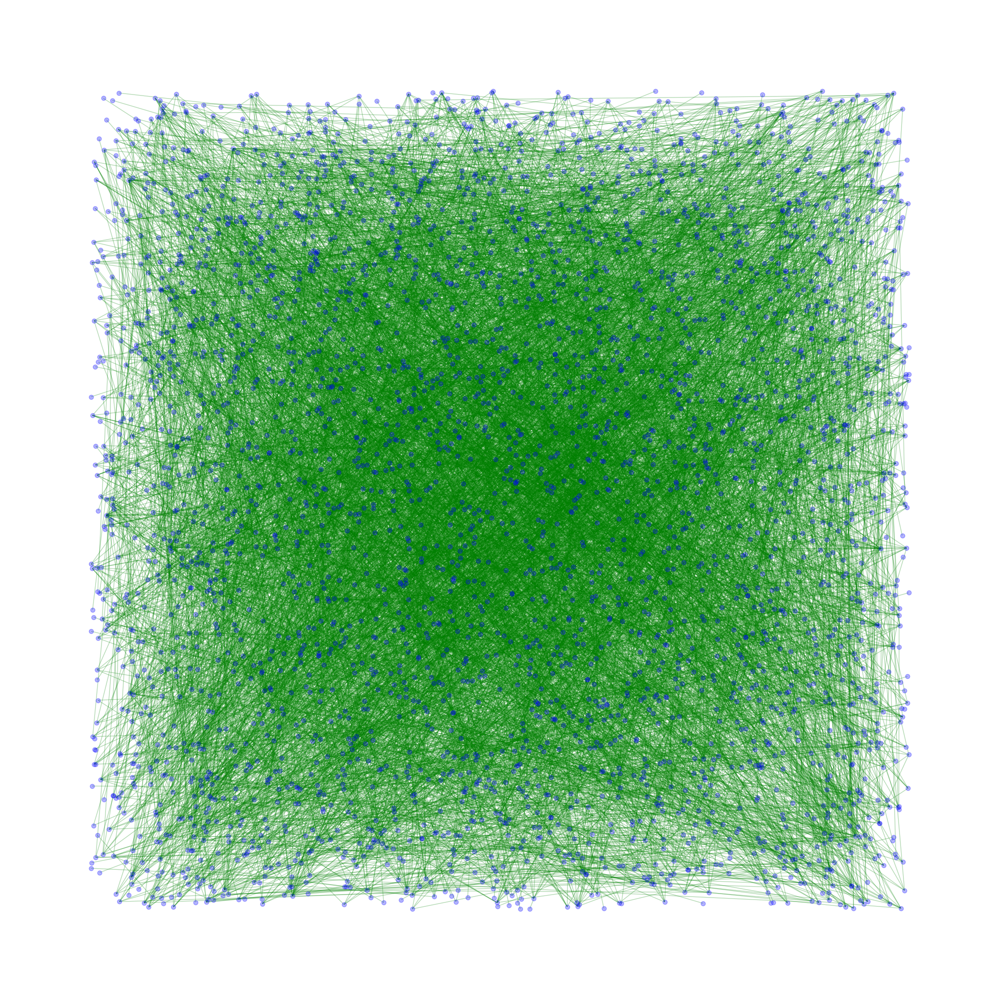

In [ ]:
# graph object construction
Graph = nx.from_pandas_edgelist(Dataset, 'Source', 'Target', create_using = nx.Graph())
plt.figure(figsize = (20, 20))
pos = nx.random_layout(Graph, seed = 30)
nx.draw(Graph, with_labels = False,  pos = pos, node_size = 40, alpha = 0.3, edge_color = 'green', node_color = 'blue')
plt.show()

## Finding Missing Edges from the Network

In [ ]:
Source = set(Dataset['Source'].unique())
Target = set(Dataset['Target'].unique())
Nodes = list(Source.union(Target))
Number_of_Nodes = len(Nodes)
Adjacency_Matrix = nx.to_numpy_array(Graph, nodelist = Nodes)

In [ ]:
Missing_Nodes = []
Number = 0
for i in tqdm(range(Number_of_Nodes)):
    for j in range(Number, Number_of_Nodes):
        if(i != j):
            try:
                if nx.shortest_path_length(Graph, Nodes[i], Nodes[j]) <= 2: 
                    if Adjacency_Matrix[i,j] == 0:
                        Missing_Nodes.append([Nodes[i], Nodes[j]])
            except:
                continue
    Number += 1

100%|██████████| 3364/3364 [06:22<00:00,  8.79it/s] 


## Sampling a Part of Connected Edges for Training

In [ ]:
Removed_Edges = []
DF = Dataset.copy()
N = 0
for i in tqdm(Dataset.index.values):
    Current = nx.from_pandas_edgelist(DF.drop(index = i), 'Source', 'Target', create_using = nx.Graph())
    if(nx.number_connected_components(Current) == 1 and len(Current.nodes) == Number_of_Nodes):
        N += 1
        if(N >= 2):
            N = 0
            continue
        Removed_Edges.append(i)
        DF = DF.drop(index = i)

100%|██████████| 10000/10000 [02:44<00:00, 60.92it/s]


## Combining Data of Connected and Missing Edges for Training

In [ ]:
Positive_Samples

,Source,Target,Label
0,1,2,1
2,1,5,1
4,2,11,1
6,2,13,1
8,3,63,1
...,...,...,...
9973,2078,76,1
9977,2079,966,1
9982,2080,2186,1
9988,2081,1849,1


In [ ]:
Positive_Samples.to_csv('Positive_Samples.csv')

In [ ]:
Negative_Samples = pd.DataFrame(list(Missing_Nodes), columns = ['Source', 'Target'])
Negative_Samples['Label'] = 0

In [ ]:
Negative_Samples = Negative_Samples.head(4330)

In [ ]:
Negative_Samples

,Source,Target,Label
0,1,6,0
1,1,7,0
2,1,8,0
3,1,9,0
4,1,10,0
...,...,...,...
4325,82,305,0
4326,82,317,0
4327,82,354,0
4328,82,358,0


In [ ]:
Negative_Samples.to_csv('Negative_Samples.csv')

In [ ]:
Train_Dataset = pd.concat([Positive_Samples, Negative_Samples], axis = 0)

In [ ]:
Train_Dataset

,Source,Target,Label
0,1,2,1
2,1,5,1
4,2,11,1
6,2,13,1
8,3,63,1
...,...,...,...
4325,82,305,0
4326,82,317,0
4327,82,354,0
4328,82,358,0


In [ ]:
Train_Dataset.to_csv('Train_Dataset.csv')

In [ ]:
X_Dataset = Train_Dataset[['Source', 'Target']]
Y_Dataset = Train_Dataset['Label']
X_Train, X_Test, Y_Train, Y_Test  = train_test_split(X_Dataset, Y_Dataset, test_size = 0.3, random_state = 10)

## Training Samples using Support Vector Classfier

In [ ]:
kernels = ['rbf', 'linear']
c_values = [0.001, 0.01, 0.1, 1]
param_grid = {'kernel':kernels, 'C':c_values}

SVM_Model = GridSearchCV(cv = 10, estimator = svm.SVC(), param_grid = param_grid)

In [ ]:
SVM_Model.fit(X_Train, Y_Train)

GridSearchCV(cv=10, estimator=SVC(),
             param_grid={'C': [0.001, 0.01, 0.1, 1],
                         'kernel': ['rbf', 'linear']})

In [ ]:
print(classification_report(SVM_Model.best_estimator_.predict(X_Test), Y_Test))

              precision    recall  f1-score   support

           0       1.00      0.94      0.97      1374
           1       0.94      1.00      0.97      1224

    accuracy                           0.97      2598
   macro avg       0.97      0.97      0.97      2598
weighted avg       0.97      0.97      0.97      2598



In [ ]:
print(confusion_matrix(SVM_Model.best_estimator_.predict(X_Test), Y_Test))

[[1292   82]
 [   0 1224]]


-----------------------------------------------------------------------------

### COMMUNITY DETECTION

# Importing Libraries

In [ ]:
import networkx as nx
from networkx.algorithms.community.centrality import girvan_newman
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
import random

In [ ]:
%matplotlib inline

In [ ]:
# First 5000 edges are considered from the original dataset
df = pd.read_csv("Book_copurchase_5k_edges.csv", nrows=5000)


In [ ]:
import networkx as nx

G1 = nx.from_pandas_edgelist(df, source='Source', target='Target')


In [ ]:
nx.write_edgelist(G1, "Book_copurchase_5k_edges_connected_graph.csv", delimiter=",", data=False)


In [ ]:
# First 5000 edges are considered from the original dataset
edge_df=pd.read_csv('Book_copurchase_5k_edges_connected_graph.csv')
edge_df.head()

,1,2
0,1,4
1,1,5
2,1,13
3,2,10
4,2,11


# Constructing Graph and Finding Communities among the Co-Purchages

## 1. Using NetworkX

In [ ]:
G=nx.Graph()
G.add_edges_from(edge_df.values.tolist())

In [ ]:
# Finding the communities using the Girvan Newman algorithm
communities = girvan_newman(G)
 
node_groups = []
for com in next(communities):
    node_groups.append(list(com))

node_groups

[[1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  49,
  50,
  51,
  52,
  53,
  54,
  55,
  56,
  57,
  58,
  59,
  60,
  61,
  62,
  63,
  64,
  65,
  66,
  67,
  68,
  69,
  70,
  71,
  72,
  73,
  74,
  75,
  76,
  77,
  78,
  79,
  80,
  81,
  82,
  83,
  84,
  85,
  86,
  87,
  88,
  89,
  90,
  91,
  92,
  93,
  94,
  95,
  96,
  97,
  98,
  99,
  100,
  101,
  102,
  103,
  104,
  105,
  106,
  107,
  108,
  109,
  110,
  111,
  112,
  113,
  114,
  115,
  116,
  117,
  118,
  119,
  120,
  121,
  127,
  128,
  129,
  130,
  131,
  132,
  133,
  134,
  135,
  136,
  137,
  138,
  139,
  140,
  141,
  142,
  143,
  144,
  145,
  146,
  147,
  148,
  149,
  150,
  151,
  152,
  153,
  154,
  155,
  156,
  157,
  158,
  159,
  160,
  161,
  162,
  163,
  164,
 

In [ ]:
communities

<generator object girvan_newman at 0x000001FB65AA14E0>

In [ ]:
len(node_groups) # Total number of communities or clusters found is 35

35

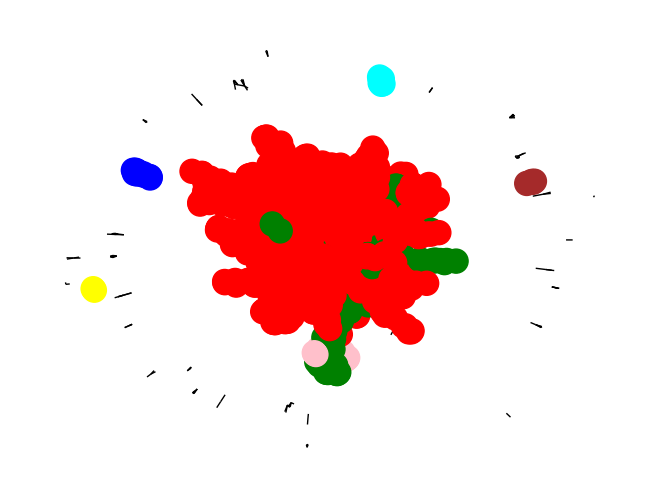

In [ ]:
color_map = []

# Taking only 7 groups out of 35
for node in G:
    if node in node_groups[0]:
        color_map.append('red')
    elif node in node_groups[1]:
        color_map.append('blue')
    elif node in node_groups[2]:
        color_map.append('green')
    elif node in node_groups[3]:
        color_map.append('yellow')
    elif node in node_groups[4]:
        color_map.append('brown')
    elif node in node_groups[5]:
        color_map.append('pink')
    elif node in node_groups[6]:
        color_map.append('cyan')
    else:
        color_map.append('#FF000000')
        
# Visualizing Communities represented by different colors
nx.draw(G, node_color=color_map,)
plt.show()

## 2. Finding Communities using igram

In [ ]:
!pip install python-igraph

  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ---------------------------------------- 2.9/2.9 MB 16.7 MB/s eta 0:00:00
  Running setup.py install for python-igraph: started
  Running setup.py install for python-igraph: finished with status 'done'


  DEPRECATION: python-igraph is being installed using the legacy 'setup.py install' method, because it does not have a 'pyproject.toml' and the 'wheel' package is not installed. pip 23.1 will enforce this behaviour change. A possible replacement is to enable the '--use-pep517' option. Discussion can be found at https://github.com/pypa/pip/issues/8559

[notice] A new release of pip available: 22.3 -> 23.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
import igraph
from igraph import *

In [ ]:
# Reading the Amazon product co-purchase dataset
data = pd.read_csv('Book_copurchase_5k_edges_connected_graph.csv', header=None, names=['source', 'target'])

# Extracting the edge list from the dataset
edge_list = list(zip(data['source'], data['target']))


In [ ]:
# igram indices start from 0, so edge list is transformed
edge_list_igraph = [[y-1 for y in x] for x in edge_list]
edge_list_igraph

[[0, 1],
 [0, 3],
 [0, 4],
 [0, 12],
 [1, 9],
 [1, 10],
 [1, 11],
 [3, 13],
 [3, 14],
 [3, 15],
 [3, 59],
 [3, 60],
 [3, 61],
 [3, 91],
 [3, 92],
 [3, 232],
 [3, 341],
 [3, 478],
 [3, 479],
 [3, 1196],
 [4, 5],
 [4, 6],
 [4, 7],
 [4, 8],
 [4, 117],
 [4, 128],
 [4, 464],
 [4, 1401],
 [12, 55],
 [12, 56],
 [12, 57],
 [12, 58],
 [12, 87],
 [12, 89],
 [12, 148],
 [12, 243],
 [12, 245],
 [12, 400],
 [12, 401],
 [12, 1172],
 [9, 5],
 [9, 7],
 [9, 16],
 [9, 19],
 [9, 20],
 [9, 35],
 [9, 36],
 [9, 37],
 [9, 45],
 [9, 46],
 [9, 72],
 [9, 216],
 [9, 217],
 [9, 218],
 [9, 318],
 [9, 393],
 [9, 394],
 [9, 424],
 [9, 1180],
 [10, 211],
 [10, 212],
 [10, 213],
 [10, 214],
 [10, 215],
 [10, 503],
 [10, 1166],
 [11, 6],
 [11, 16],
 [11, 17],
 [11, 118],
 [11, 119],
 [11, 21],
 [11, 65],
 [11, 150],
 [11, 164],
 [11, 165],
 [11, 191],
 [11, 360],
 [11, 372],
 [11, 433],
 [11, 481],
 [11, 1062],
 [2, 50],
 [2, 51],
 [2, 52],
 [2, 53],
 [2, 54],
 [50, 24],
 [50, 51],
 [50, 80],
 [50, 81],
 [50, 52],
 [50

In [ ]:
# defining the graph and adding edges & vertices; stored in adjancency list
g2 = Graph()
g2.add_vertices(5000)
g2.add_edges(edge_list_igraph)
print(g2)

IGRAPH U--- 5000 3846 --
+ edges:
0--1 0--3 0--4 0--12 1--9 1--10 1--11 3--13 3--14 3--15 3--59 3--60 3--61
3--91 3--92 3--232 3--341 3--478 3--479 3--1196 4--5 4--6 4--7 4--8 4--117
4--128 4--464 4--1401 12--55 12--56 12--57 12--58 12--87 12--89 12--148
12--243 12--245 12--400 12--401 12--1172 5--9 7--9 9--16 9--19 9--20 9--35
9--36 9--37 9--45 9--46 9--72 9--216 9--217 9--218 9--318 9--393 9--394 9--424
9--1180 10--211 10--212 10--213 10--214 10--215 10--503 10--1166 6--11 11--16
11--17 11--118 11--119 11--21 11--65 11--150 11--164 11--165 11--191 11--360
11--372 11--433 11--481 11--1062 2--50 2--51 2--52 2--53 2--54 24--50 50--51
50--80 50--81 50--52 50--53 50--54 50--82 50--83 50--146 50--147 50--249
50--282 50--306 50--307 50--415 50--431 50--432 50--508 50--1048 51--53
51--229 51--230 51--329 51--432 52--53 52--81 52--82 52--83 52--329 52--432
53--329 53--432 24--54 54--100 54--231 54--296 54--845 54--1336 13--15 13--59
13--61 13--60 13--91 5--14 6--14 14--24 14--25 14--68 14--69

In [ ]:
# Nodes with zero degree are removed from adjacency list
to_delete_ids = [v.index for v in g2.vs if v.degree() == 0]
g2.delete_vertices(to_delete_ids)

In [ ]:
print(g2)

IGRAPH U--- 1963 3846 --
+ edges:
   0 --    1    3    4   12
   1 --    0    9   10   11
   2 --   50   51   52   53   54
   3 --    0   13   14   15   59   60   61   91   92  232  341  478  479 1193
   4 --    0    5    6    7    8  117  128  464 1398
   5 --    4    6    7    9   14   16  128  464  505  861 1062 1438
   6 --    4    5   11   14   16   17   18   24   32   66   80   81   94   97
136  159  174  188  189  237  246  253  255  359  362  377  397  456  505  515
517  518  544  595  771
   7 --    4    5    9   24   25  100  117  140 1012 1372
   8 --    4  116  117  379
   9 --    1    5    7   16   19   20   35   36   37   45   46   72  216  217
218  318  393  394  424 1177
  10 --    1  211  212  213  214  215  503 1163
  11 --    1    6   16   17   21   65  118  119  150  164  165  191  360  372
433  481 1059
  12 --    0   55   56   57   58   87   89  148  243  245  400  401 1169
  13 --    3   15   59   60   61   91
  14 --    3    5    6   24   25   68   69  140
  15 

In [ ]:
# created commmunities based on edge betweeness
v = g2.community_edge_betweenness(directed=True)
print(v)

Dendrogram, 1963 elements, 1929 merges


In [ ]:
# groupping the nodes into clusters with cluster indices
cluster1 = v.as_clustering()
print(cluster1)

Clustering with 1963 elements and 78 clusters
[ 0] 0, 1, 4, 5, 7, 8, 9, 16, 19, 20, 26, 29, 35, 36, 37, 39, 45, 46, 72, 116,
     117, 126, 128, 129, 173, 174, 216, 217, 218, 219, 224, 301, 302, 303,
     304, 318, 355, 393, 394, 395, 424, 437, 438, 464, 465, 466, 603, 604,
     609, 611, 612, 681, 682, 744, 745, 746, 860, 861, 1067, 1068, 1177, 1268,
     1269, 1270, 1579, 1689, 1690, 1761, 1785, 1786, 1819
[ 1] 2, 50, 51, 52, 53, 80, 81, 82, 83, 111, 146, 147, 180, 229, 231, 249,
     282, 291, 293, 306, 307, 329, 340, 364, 365, 431, 432, 441, 454, 455,
     495, 506, 507, 508, 566, 567, 630, 631, 698, 751, 752, 825, 905, 1003,
     1004, 1045, 1046, 1047, 1178, 1196, 1197, 1204, 1205, 1313, 1314, 1332,
     1386, 1387, 1388, 1389, 1397, 1492, 1559, 1560, 1755, 1756, 1791, 1792,
     1793, 1871, 1872, 1911, 1912, 1913, 1941, 1942, 1943
[ 2] 3, 13, 15, 59, 60, 61, 90, 91, 92, 104, 105, 106, 107, 114, 115, 162,
     232, 341, 350, 478, 479, 662, 1193, 1930
[ 3] 6, 18, 32, 33, 34, 65, 6

In [ ]:
# modularity value
cluster1.modularity

0.8931468803213906

In [ ]:
# membership list : which cluster each node belongs
cluster1.membership

[0,
 0,
 1,
 2,
 0,
 0,
 3,
 0,
 0,
 0,
 4,
 5,
 6,
 2,
 7,
 2,
 0,
 5,
 3,
 0,
 0,
 5,
 5,
 8,
 9,
 7,
 0,
 10,
 11,
 0,
 12,
 12,
 3,
 3,
 3,
 0,
 0,
 0,
 9,
 0,
 13,
 11,
 11,
 11,
 10,
 0,
 0,
 11,
 11,
 11,
 1,
 1,
 1,
 1,
 9,
 6,
 6,
 5,
 6,
 2,
 2,
 2,
 5,
 5,
 5,
 3,
 14,
 3,
 7,
 7,
 12,
 12,
 0,
 9,
 11,
 11,
 10,
 10,
 10,
 10,
 1,
 1,
 1,
 1,
 5,
 5,
 6,
 6,
 6,
 6,
 2,
 2,
 2,
 5,
 5,
 5,
 12,
 12,
 10,
 15,
 16,
 16,
 6,
 5,
 2,
 2,
 2,
 2,
 5,
 5,
 5,
 1,
 15,
 6,
 2,
 2,
 0,
 0,
 5,
 5,
 5,
 8,
 8,
 8,
 8,
 8,
 0,
 17,
 0,
 0,
 9,
 11,
 14,
 14,
 11,
 11,
 3,
 7,
 7,
 7,
 7,
 18,
 12,
 9,
 9,
 10,
 1,
 1,
 6,
 5,
 5,
 16,
 16,
 16,
 5,
 5,
 15,
 15,
 10,
 10,
 15,
 10,
 2,
 3,
 5,
 5,
 5,
 5,
 5,
 5,
 17,
 17,
 17,
 0,
 0,
 19,
 18,
 20,
 18,
 18,
 1,
 5,
 21,
 5,
 5,
 21,
 10,
 10,
 22,
 3,
 3,
 5,
 17,
 5,
 5,
 21,
 21,
 22,
 22,
 10,
 22,
 5,
 17,
 17,
 21,
 22,
 5,
 5,
 17,
 17,
 5,
 4,
 4,
 4,
 4,
 4,
 0,
 0,
 0,
 0,
 5,
 12,
 12,
 12,
 0,
 13,
 13,
 13,
 13,
 1,
 

In [ ]:
# Assigning differnt colors to the nodes belonging to same cluster
color_palletes = igraph.drawing.colors.ClusterColoringPalette(len(cluster1))
g2.vs['color'] = color_palletes.get_many(cluster1.membership)

<AxesSubplot: >

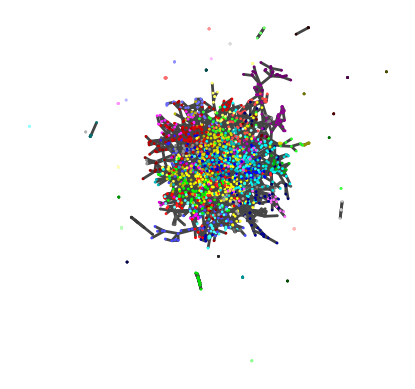

In [ ]:
# visualization in another form of layout
fig, ax = plt.subplots()
igraph.plot(g2, layout= g2.layout_fruchterman_reingold(),
            vertex_frame_width=0,
            target = ax)

----------------------------------------------------------------------------------------------------

### BASIC RECOMMENDER SYSTEM 

### Importing the required modules

In [ ]:
!pip install stemming


[notice] A new release of pip available: 22.3 -> 23.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
import string
import re
from nltk.corpus import stopwords
from stemming.porter2 import stem
import networkx 
from operator import itemgetter

### Accessing the meta-data

In [ ]:
Metadata_File = open('amazon-meta.txt', 'r', encoding = 'utf-8')
Amazon_Products = {}

In [ ]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to C:\Users\Abhishek
[nltk_data]     Singhi\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
import re
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer

ps = PorterStemmer()
stopwords = set(stopwords.words("english"))
Amazon_Products = {}

def process_categories(categories):
    categories = re.compile('[%s]' % re.escape(string.digits + string.punctuation)).sub(' ', categories)
    categories = ' '.join(set(categories.lower().split()) - set(stopwords))
    categories = ' '.join(ps.stem(word) for word in categories.split())
    return categories

def add_metadata_to_products():
    global Amazon_Products
    with open('amazon-meta.txt', 'r',encoding = 'utf-8') as metadata_file:
      meta_data = {}
      for line in metadata_file:
        line = line.strip()

        if line.startswith('Id'):
            meta_data['Id'] = line[3:].strip()
        elif line.startswith('ASIN'):
            meta_data['ASIN'] = line[5:].strip()
        elif line.startswith('title'):
            meta_data['Title'] = ' '.join(line[6:].strip().split())
        elif line.startswith('group'):
            meta_data['Group'] = line[6:].strip()
        elif line.startswith('salesrank'):
            meta_data['SalesRank'] = int(line[10:].strip())
        elif line.startswith('similar'):
            meta_data['Copurchased'] = ' '.join(line.split()[2:])
        elif line.startswith('categories'):
            categories = ''
            num_categories = int(line.split()[1].strip())
            for i in range(num_categories):
                categories += metadata_file.readline().strip()
            meta_data['Categories'] = process_categories(categories)
        elif line.startswith('reviews'):
            total_reviews, avg_rating = 0, 0.0
            for review_line in metadata_file:
                review_line = review_line.strip()
                if not review_line:
                    break
                if review_line.startswith('total'):
                    total_reviews = int(review_line.split()[2].strip())
                    avg_rating = float(review_line.split()[7].strip())
            meta_data['TotalReviews'] = total_reviews
            meta_data['AvgRating'] = avg_rating

            # reset for next product
            Amazon_Products[meta_data['ASIN']] = meta_data
            meta_data = {}
add_metadata_to_products()

In [ ]:
# Amazon_Products
# Amazon_Products.items()

### Filtering out data related to book records

In [ ]:
# Amazon_Books.keys()

In [ ]:
Amazon_Books = {}
for asin, metadata in Amazon_Products.items():
    if (metadata['Group'] == 'Book'):
        Amazon_Books[asin] = Amazon_Products[asin]

In [ ]:
for asin, metadata in Amazon_Books.items():
    Amazon_Books[asin]['Copurchased'] = ' '.join([cp for cp in metadata['Copurchased'].split() if cp in Amazon_Books.keys()])

In [ ]:
Amazon_Books

{'0827229534': {'Id': '1',
  'ASIN': '0827229534',
  'Title': 'Patterns of Preaching: A Sermon Sampler',
  'Group': 'Book',
  'SalesRank': 396585,
  'Copurchased': '0804215715 156101074X 0687023955 0687074231 082721619X',
  'Categories': 'subject spiritu sermon religion christian book clergi preach',
  'TotalReviews': 0,
  'AvgRating': 0.0},
 '0738700797': {'Id': '2',
  'ASIN': '0738700797',
  'Title': 'Candlemas: Feast of Flames',
  'Group': 'Book',
  'SalesRank': 168596,
  'Copurchased': '0738700827 1567184960 1567182836 0738700525 0738700940',
  'Categories': 'earth subject religion spiritu witchcraft religion wicca book base',
  'TotalReviews': 0,
  'AvgRating': 0.0},
 '0486287785': {'Id': '3',
  'ASIN': '0486287785',
  'Title': 'World War II Allied Fighter Planes Trading Cards',
  'Group': 'Book',
  'SalesRank': 1270652,
  'Copurchased': '',
  'Categories': 'garden subject gener home hobbi book craft',
  'TotalReviews': 0,
  'AvgRating': 0.0},
 '0842328327': {'Id': '4',
  'ASIN': 

### Adding recommendation property

In [ ]:
Copurchase_Graph = networkx.Graph() 
for asin, metadata in Amazon_Books.items():
    Copurchase_Graph.add_node(asin) 
    for a in metadata['Copurchased'].split():
        Copurchase_Graph.add_node(a.strip()) 
        similarity = 0 
        n1 = set((Amazon_Books[asin]['Categories']).split())
        n2 = set((Amazon_Books[a]['Categories']).split()) 
        n1In2 = n1 & n2           
        n1Un2 = n1 | n2
        if(len(n1In2)) > 0:
            similarity = round(len(n1In2) / len(n1Un2), 2) 
            Copurchase_Graph.add_edge(asin, a.strip(), weight = similarity)

In [ ]:
dc = networkx.degree(Copurchase_Graph) 
for asin in networkx.nodes(Copurchase_Graph):
    metadata = Amazon_Books[asin] 
    metadata['DegreeCentrality'] = int(dc[asin]) 
    ego = networkx.ego_graph(Copurchase_Graph, asin, radius = 1) 
    metadata['ClusteringCoeff'] = round(networkx.average_clustering(ego), 2)
    Amazon_Books[asin] = metadata 

In [ ]:
Amazon_Books_File = open('amazon-books.txt', 'w', encoding = 'utf-8', errors = 'ignore')

Amazon_Books_File.write("Id\t" + "ASIN\t" + "Title\t" + "Categories\t" + "Group\t" + "Copurchased\t" + "SalesRank\t" + "TotalReviews\t" + "AvgRating\t" "DegreeCentrality\t" + 
                        "ClusteringCoeff\n") 

for asin, metadata in Amazon_Books.items(): # converting the meta-data into txt file
     Amazon_Books_File.write(metadata['Id'] + "\t" + \
                             asin + "\t" +  \
                             metadata['Title'] + "\t" + \
                             metadata['Categories'] + "\t" + \
                             metadata['Group'] + "\t" +  \
                             metadata['Copurchased'] + "\t" + \
                             str(metadata['SalesRank']) + "\t" + \
                             str(metadata['TotalReviews']) + "\t" + 
                             str(metadata['AvgRating']) + "\t" + \
                             str(metadata['DegreeCentrality']) + "\t" + \
                             str(metadata['ClusteringCoeff']) + "\n")

Amazon_Books_File.close()

In [ ]:
# writing the adjacency edge list
Amazon_Books_File = open("amazon-books-copurchase.edgelist", 'wb') 
networkx.write_weighted_edgelist(Copurchase_Graph, Amazon_Books_File) 
Amazon_Books_File.close() 

### Reading the text file

In [ ]:
Books_File = open('amazon-books.txt', 'r', encoding = 'utf-8', errors = 'ignore')
Books = {}
Books_File.readline()
for line in Books_File:
    cell = line.split("\t") 
    MetaData = {}
    MetaData['Id'] = cell[0].strip() 
    ASIN = cell[1].strip()
    MetaData['Title'] = cell[2].strip() 
    MetaData['Categories'] = cell[3].strip() 
    MetaData['Group'] = cell[4].strip() 
    MetaData['Copurchased'] = cell[5].strip()
    MetaData['SalesRank'] = int(cell[6].strip())
    MetaData['TotalReviews'] = int(cell[7].strip())
    MetaData['AvgRating'] = float(cell[8].strip())
    MetaData['DegreeCentrality'] = int(cell[9].strip())
    MetaData['ClusteringCoeff'] = float(cell[10].strip())
    Books[ASIN] = MetaData 
Books_File.close()

In [ ]:
Books_File = open("amazon-books-copurchase.edgelist", "rb") 
Copurchase_Graph = networkx.read_weighted_edgelist(Books_File) 
Books_File.close() 

### Giving Book id as input for recommending books

In [ ]:
print("Looking for Recommendations for Customer Purchasing this Book: ")
print("---------------------------------------------------------------")
Purchased_ASIN = '0843939338'
print("ASIN = ", Purchased_ASIN)
print("Title = ", Books[Purchased_ASIN]['Title'])
print("SalesRank = ", Books[Purchased_ASIN]['SalesRank'])
print("TotalReviews = ", Books[Purchased_ASIN]['TotalReviews'])
print("AvgRating = ", Books[Purchased_ASIN]['AvgRating'])
print("DegreeCentrality = ", Books[Purchased_ASIN]['DegreeCentrality'])
print("ClusteringCoeff = ", Books[Purchased_ASIN]['ClusteringCoeff'])

Looking for Recommendations for Customer Purchasing this Book: 
---------------------------------------------------------------
ASIN =  0843939338
Title =  White Wind
SalesRank =  43571
TotalReviews =  0
AvgRating =  0.0
DegreeCentrality =  5
ClusteringCoeff =  0.9


In [ ]:
networkx.nodes(Copurchase_Graph)

NodeView(('0827229534', '0804215715', '156101074X', '0687023955', '0687074231', '082721619X', '0805415505', '0802842623', '0800628411', '0687179246', '0687173094', '0687336481', '0801021979', '082720230X', '0802801323', '0801090598', '0687066301', '0800620968', '0825420733', '0800627733', '0800623134', '0687085934', '0687047447', '0687085292', '0800629973', '0687028256', '1556735731', '082641060X', '0802846092', '0664221912', '0664251587', '0687186943', '066422296X', '0687045169', '0836133307', '0767907442', '0827229720', '080913781X', '1561011576', '1561011673', '1561011428', '0687090776', '0281052859', '0691029172', '0829814442', '0687045320', '0827206275', '0830815759', '0896225747', '1568540949', '0664258476', '0664252443', '0827234392', '0687006325', '1570750017', '066421942X', '0687186927', '0664222641', '080284152X', '156854040X', '0738700797', '0738700827', '1567184960', '1567182836', '0738700525', '0738700940', '0835608158', '0835607690', '1567187196', '0140196161', '087542090

In [ ]:
n = Purchased_ASIN
ego = networkx.ego_graph(Copurchase_Graph, n, radius = 1)
Purchased_ASIN_Ego_Graph = networkx.Graph(ego)

In [ ]:
threshold = 0.5 # finding the nodes having similarity measure based on category above the threshold value
Purchased_ASIN_Ego_Trim_Graph = networkx.Graph()
for f, t, e in Purchased_ASIN_Ego_Graph.edges(data = True):
    if e['weight'] >= threshold: 
        Purchased_ASIN_Ego_Trim_Graph.add_edge(f, t)

In [ ]:
Purchased_ASIN_Ego_Trim_Graph

In [ ]:
Purchased_ASIN_Neighbors = Purchased_ASIN_Ego_Trim_Graph.neighbors(Purchased_ASIN)

In [ ]:
ASIN_Meta = []
for asin in Purchased_ASIN_Neighbors:
    ASIN = asin
    Title = Amazon_Books[ASIN]['Title']
    SalesRank = Amazon_Books[ASIN]['SalesRank']
    TotalReviews = Amazon_Books[ASIN]['TotalReviews']
    AvgRating = Amazon_Books[ASIN]['AvgRating']
    DegreeCentrality = Amazon_Books[ASIN]['DegreeCentrality']
    ASIN_Meta.append((ASIN, Title, SalesRank, TotalReviews, AvgRating, DegreeCentrality, ClusteringCoeff))

In [ ]:
Top5_ByAbgRating_ThenByTotalReviews = sorted(ASIN_Meta, key = lambda x: (x[4], x[3]), reverse = True)[:5]

In [ ]:
print()
print("Top Recommendations By AvgRating Then By TotalReviews for Users Purchased The Book: ")
print("--------------------------------------------------------------------------------------")
print('ASIN\t', 'Title\t', 'SalesRank\t', 'TotalReviews\t', 'AvgRating\t', 'DegreeCentrality\t', 'ClusteringCoeff')
for asin in Top5_ByAbgRating_ThenByTotalReviews:
    print(asin)

print()


Top Recommendations By AvgRating Then By TotalReviews for Users Purchased The Book: 
--------------------------------------------------------------------------------------
ASIN	 Title	 SalesRank	 TotalReviews	 AvgRating	 DegreeCentrality	 ClusteringCoeff
('084394790X', 'White Dreams', 112273, 0, 0.0, 5, 0.0)
('0843944714', 'White Wolf', 77731, 0, 0.0, 5, 0.0)
('0843947039', 'White Nights', 63959, 0, 0.0, 4, 0.0)
('0843948906', 'White Dove', 225834, 0, 0.0, 5, 0.0)
('084394613X', 'White Flame', 87510, 0, 0.0, 6, 0.0)



PART 2
------------------
Session Based Recommendation with a unique dataset

In Session Based Recommenders we  focus on giving next-click recommendations to anonymous users, based on their current browser session. The aim is to recommend products that are “relevant” to the user. This enhances the shopping experience for the user, and also increases the likelihood of them making a  purchase. 

Word2Vec is a model that, when well trained, is capable of capturing the meaning of words, based on their context.

In [ ]:
import os
import numpy as np 
import gc
import shutil
import glob

import cudf
import nvtabular as nvt

/usr/local/lib/python3.10/dist-packages/merlin/dtypes/mappings/triton.py:53: UserWarning: Triton dtype mappings did not load successfully due to an error: No module named 'tritonclient'
  warn(f"Triton dtype mappings did not load successfully due to an error: {exc.msg}")


In [ ]:
import torch

In [ ]:
torch.cuda.empty_cache()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Data Preprocessing

In [ ]:
# define some information about where to get our data
INPUT_DATA_DIR = os.environ.get("INPUT_DATA_DIR", "/content/drive/MyDrive/workspace/data/")

In [ ]:
raw_df = cudf.read_csv(os.path.join(INPUT_DATA_DIR, '/content/drive/MyDrive/2019-Oct.csv')) 
raw_df.head()

,event_time,event_type,product_id,category_id,category_code,brand,price,user_id,user_session
0,2019-10-01 00:00:00 UTC,view,44600062,2.100000e+18,<NA>,shiseido,35.79,541312140,72d76fde-8bb3-4e00-8c23-a032dfed738c
1,2019-10-01 00:00:00 UTC,view,3900821,2.050000e+18,appliances.environment.water_heater,aqua,33.20,554748717,9333dfbd-b87a-4708-9857-6336556b0fcc
2,2019-10-01 00:00:01 UTC,view,17200506,2.050000e+18,furniture.living_room.sofa,<NA>,543.10,519107250,566511c2-e2e3-422b-b695-cf8e6e792ca8
3,2019-10-01 00:00:01 UTC,view,1307067,2.050000e+18,computers.notebook,lenovo,251.74,550050854,7c90fc70-0e80-4590-96f3-13c02c18c713
4,2019-10-01 00:00:04 UTC,view,1004237,2.050000e+18,electronics.smartphone,apple,1081.98,535871217,c6bd7419-2748-4c56-95b4-8cec9ff8b80d


In [ ]:
raw_df.shape

(900249, 9)

## Convert timestamp from datetime

In [ ]:
raw_df['event_time_dt'] = raw_df['event_time'].astype('datetime64[s]')
raw_df['event_time_ts']= raw_df['event_time_dt'].astype('int')
raw_df.head()

,event_time,event_type,product_id,category_id,category_code,brand,price,user_id,user_session,event_time_dt,event_time_ts
0,2019-10-01 00:00:00 UTC,view,44600062,2.100000e+18,<NA>,shiseido,35.79,541312140,72d76fde-8bb3-4e00-8c23-a032dfed738c,2019-10-01 00:00:00,1569888000
1,2019-10-01 00:00:00 UTC,view,3900821,2.050000e+18,appliances.environment.water_heater,aqua,33.20,554748717,9333dfbd-b87a-4708-9857-6336556b0fcc,2019-10-01 00:00:00,1569888000
2,2019-10-01 00:00:01 UTC,view,17200506,2.050000e+18,furniture.living_room.sofa,<NA>,543.10,519107250,566511c2-e2e3-422b-b695-cf8e6e792ca8,2019-10-01 00:00:01,1569888001
3,2019-10-01 00:00:01 UTC,view,1307067,2.050000e+18,computers.notebook,lenovo,251.74,550050854,7c90fc70-0e80-4590-96f3-13c02c18c713,2019-10-01 00:00:01,1569888001
4,2019-10-01 00:00:04 UTC,view,1004237,2.050000e+18,electronics.smartphone,apple,1081.98,535871217,c6bd7419-2748-4c56-95b4-8cec9ff8b80d,2019-10-01 00:00:04,1569888004


In [ ]:
# check out the columns with nulls
raw_df.isnull().any()

event_time       False
event_type       False
product_id       False
category_id      False
category_code     True
brand             True
price            False
user_id          False
user_session     False
event_time_dt    False
event_time_ts    False
dtype: bool

In [ ]:
# Remove rows where `user_session` is null.
raw_df = raw_df[raw_df['user_session'].isnull()==False]
len(raw_df)

900249

In [ ]:
#we no longer need event_time
raw_df = raw_df.drop(['event_time'],  axis=1)

## Categorise user_session column

In [ ]:
cols = list(raw_df.columns)
cols.remove('user_session')
cols

['event_type',
 'product_id',
 'category_id',
 'category_code',
 'brand',
 'price',
 'user_id',
 'event_time_dt',
 'event_time_ts']

In [ ]:
# load data 
df_event = nvt.Dataset(raw_df) 

# categorify user_session 
cat_feats = ['user_session'] >> nvt.ops.Categorify()

workflow = nvt.Workflow(cols + cat_feats)
workflow.fit(df_event)
df = workflow.transform(df_event).to_ddf().compute()

In [ ]:
df.head()

,user_session,event_type,product_id,category_id,category_code,brand,price,user_id,event_time_dt,event_time_ts
0,113509,view,44600062,2.100000e+18,<NA>,shiseido,35.79,541312140,2019-10-01 00:00:00,1569888000
1,176321,view,3900821,2.050000e+18,appliances.environment.water_heater,aqua,33.20,554748717,2019-10-01 00:00:00,1569888000
2,14610,view,17200506,2.050000e+18,furniture.living_room.sofa,<NA>,543.10,519107250,2019-10-01 00:00:01,1569888001
3,34300,view,1307067,2.050000e+18,computers.notebook,lenovo,251.74,550050854,2019-10-01 00:00:01,1569888001
4,92115,view,1004237,2.050000e+18,electronics.smartphone,apple,1081.98,535871217,2019-10-01 00:00:04,1569888004


In [ ]:
raw_df = None
del(raw_df)

In [ ]:
gc.collect()

361

In [ ]:
%%time
df = df.sort_values(['user_session', 'event_time_ts']).reset_index(drop=True)

print("Count with in-session repeated interactions: {}".format(len(df)))
# Sorts the dataframe by session and timestamp, to remove consecutive repetitions
df['product_id_past'] = df['product_id'].shift(1).fillna(0)
df['session_id_past'] = df['user_session'].shift(1).fillna(0)
#Keeping only no consecutive repeated in session interactions
df = df[~((df['user_session'] == df['session_id_past']) & \
             (df['product_id'] == df['product_id_past']))]
print("Count after removed in-session repeated interactions: {}".format(len(df)))
del(df['product_id_past'])
del(df['session_id_past'])

gc.collect()

Count with in-session repeated interactions: 900249
Count after removed in-session repeated interactions: 661355
CPU times: user 298 ms, sys: 12.6 ms, total: 311 ms
Wall time: 307 ms


0

## Include the item first time seen feature (for recency calculation)

In [ ]:
item_first_interaction_df = df.groupby('product_id').agg({'event_time_ts': 'min'}) \
            .reset_index().rename(columns={'event_time_ts': 'prod_first_event_time_ts'})
item_first_interaction_df.head()
gc.collect()

17

In [ ]:
df = df.merge(item_first_interaction_df, on=['product_id'], how='left').reset_index(drop=True)

In [ ]:
df.head()

,user_session,event_type,product_id,category_id,category_code,brand,price,user_id,event_time_dt,event_time_ts,prod_first_event_time_ts
0,49,view,3100363,2.050000e+18,appliances.kitchen.blender,saturn,8.98,519857099,2019-10-01 06:19:44,1569910784,1569896813
1,49,view,3100553,2.050000e+18,appliances.kitchen.blender,gorenje,22.91,519857099,2019-10-01 06:19:55,1569910795,1569906258
2,49,view,3100363,2.050000e+18,appliances.kitchen.blender,saturn,8.98,519857099,2019-10-01 06:20:14,1569910814,1569896813
3,49,view,3100819,2.050000e+18,appliances.kitchen.blender,polaris,51.46,519857099,2019-10-01 06:20:29,1569910829,1569896732
4,49,view,3100825,2.050000e+18,appliances.kitchen.blender,scarlett,13.31,519857099,2019-10-01 06:20:43,1569910843,1569910179


In [ ]:
del(item_first_interaction_df)
item_first_interaction_df=None
gc.collect()

0

In [ ]:
df['event_time_dt'].min()

numpy.datetime64('2019-10-01T00:00:00')

In [ ]:
# Filters only the first week of the data.
df = df[df['event_time_dt'] < np.datetime64('2019-10-08')].reset_index(drop=True)

In [ ]:
df['event_time_dt'].max()

numpy.datetime64('2019-10-01T15:55:52')

In [ ]:
df = df.drop(['event_time_dt'],  axis=1)


In [ ]:
df.head()

,user_session,event_type,product_id,category_id,category_code,brand,price,user_id,event_time_ts,prod_first_event_time_ts
0,49,view,3100363,2.050000e+18,appliances.kitchen.blender,saturn,8.98,519857099,1569910784,1569896813
1,49,view,3100553,2.050000e+18,appliances.kitchen.blender,gorenje,22.91,519857099,1569910795,1569906258
2,49,view,3100363,2.050000e+18,appliances.kitchen.blender,saturn,8.98,519857099,1569910814,1569896813
3,49,view,3100819,2.050000e+18,appliances.kitchen.blender,polaris,51.46,519857099,1569910829,1569896732
4,49,view,3100825,2.050000e+18,appliances.kitchen.blender,scarlett,13.31,519857099,1569910843,1569910179


In [ ]:
df.to_parquet(os.path.join(INPUT_DATA_DIR, 'Oct-2019.parquet'))

# ETL with NVTabular

In [ ]:
import os

import numpy as np 
import cupy as cp
import glob

import cudf
import nvtabular as nvt

from nvtabular.ops import Operator
from merlin.dag import ColumnSelector
from merlin.schema import Schema, Tags

In [ ]:
# define data path about where to get our data
INPUT_DATA_DIR = os.environ.get("INPUT_DATA_DIR", "/content/drive/MyDrive/workspace/data/")

In [ ]:
%%time
df = cudf.read_parquet(os.path.join(INPUT_DATA_DIR, 'Oct-2019.parquet'))  
print(df.head(5))

   user_session event_type  product_id   category_id  \
0            49       view     3100363  2.050000e+18   
1            49       view     3100553  2.050000e+18   
2            49       view     3100363  2.050000e+18   
3            49       view     3100819  2.050000e+18   
4            49       view     3100825  2.050000e+18   

                category_code     brand  price    user_id  event_time_ts  \
0  appliances.kitchen.blender    saturn   8.98  519857099     1569910784   
1  appliances.kitchen.blender   gorenje  22.91  519857099     1569910795   
2  appliances.kitchen.blender    saturn   8.98  519857099     1569910814   
3  appliances.kitchen.blender   polaris  51.46  519857099     1569910829   
4  appliances.kitchen.blender  scarlett  13.31  519857099     1569910843   

   prod_first_event_time_ts  
0                1569896813  
1                1569906258  
2                1569896813  
3                1569896732  
4                1569910179  
CPU times: user 136 ms, sy

In [ ]:
df.shape


(661355, 10)

In [ ]:
df.isnull().any()

user_session                False
event_type                  False
product_id                  False
category_id                 False
category_code                True
brand                        True
price                       False
user_id                     False
event_time_ts               False
prod_first_event_time_ts    False
dtype: bool

In [ ]:
# categorify features 
item_id = ['product_id'] >> nvt.ops.TagAsItemID()
cat_feats = item_id + ['category_code', 'brand', 'user_id', 'category_id', 'event_type'] >> nvt.ops.Categorify(start_index=1)

In [ ]:
# create time features
session_ts = ['event_time_ts']

session_time = (
    session_ts >> 
    nvt.ops.LambdaOp(lambda col: cudf.to_datetime(col, unit='s')) >> 
    nvt.ops.Rename(name = 'event_time_dt')
)

sessiontime_weekday = (
    session_time >> 
    nvt.ops.LambdaOp(lambda col: col.dt.weekday) >> 
    nvt.ops.Rename(name ='et_dayofweek')
)

In [ ]:
def get_cycled_feature_value_sin(col, max_value):
    value_scaled = (col + 0.000001) / max_value
    value_sin = np.sin(2*np.pi*value_scaled)
    return value_sin

def get_cycled_feature_value_cos(col, max_value):
    value_scaled = (col + 0.000001) / max_value
    value_cos = np.cos(2*np.pi*value_scaled)
    return value_cos

In [ ]:
weekday_sin = (sessiontime_weekday >> 
               (lambda col: get_cycled_feature_value_sin(col+1, 7)) >> 
               nvt.ops.Rename(name = 'et_dayofweek_sin') >>
               nvt.ops.AddMetadata(tags=[Tags.CONTINUOUS])
              )
    
weekday_cos= (sessiontime_weekday >> 
              (lambda col: get_cycled_feature_value_cos(col+1, 7)) >> 
              nvt.ops.Rename(name = 'et_dayofweek_cos') >>
              nvt.ops.AddMetadata(tags=[Tags.CONTINUOUS])
             )

In [ ]:
class ItemRecency(nvt.ops.Operator):
    def transform(self, columns, gdf):
        for column in columns.names:
            col = gdf[column]
            item_first_timestamp = gdf['prod_first_event_time_ts']
            delta_days = (col - item_first_timestamp) / (60*60*24)
            gdf[column + "_age_days"] = delta_days * (delta_days >=0)
        return gdf

    def compute_selector(
        self,
        input_schema: Schema,
        selector: ColumnSelector,
        parents_selector: ColumnSelector,
        dependencies_selector: ColumnSelector,
    ) -> ColumnSelector:
        self._validate_matching_cols(input_schema, parents_selector, "computing input selector")
        return parents_selector

    def column_mapping(self, col_selector):
        column_mapping = {}
        for col_name in col_selector.names:
            column_mapping[col_name + "_age_days"] = [col_name]
        return column_mapping

    @property
    def dependencies(self):
        return ["prod_first_event_time_ts"]

    @property
    def output_dtype(self):
        return np.float64

In [ ]:
recency_features = ['event_time_ts'] >> ItemRecency() 
recency_features_norm = (recency_features >> 
                         nvt.ops.LogOp() >> 
                         nvt.ops.Normalize(out_dtype=np.float32) >> 
                         nvt.ops.Rename(name='product_recency_days_log_norm')
                        )

In [ ]:
time_features = (
    session_time +
    sessiontime_weekday +
    weekday_sin +
    weekday_cos +
    recency_features_norm
)

In [ ]:
# Smoothing price long-tailed distribution and applying standardization
price_log = ['price'] >> nvt.ops.LogOp() >> nvt.ops.Normalize(out_dtype=np.float32) >> nvt.ops.Rename(name='price_log_norm')

In [ ]:
# Relative price to the average price for the category_id
def relative_price_to_avg_categ(col, gdf):
    epsilon = 1e-5
    col = ((gdf['price'] - col) / (col + epsilon)) * (col > 0).astype(int)
    return col
    
avg_category_id_pr = ['category_id'] >> nvt.ops.JoinGroupby(cont_cols =['price'], stats=["mean"]) >> nvt.ops.Rename(name='avg_category_id_price')
relative_price_to_avg_category = (
    avg_category_id_pr >> 
    nvt.ops.LambdaOp(relative_price_to_avg_categ, dependency=['price']) >> 
    nvt.ops.Rename(name="relative_price_to_avg_categ_id") >>
    nvt.ops.AddMetadata(tags=[Tags.CONTINUOUS])
)

In [ ]:
groupby_feats = ['event_time_ts', 'user_session'] + cat_feats + time_features + price_log + relative_price_to_avg_category

In [ ]:
groupby_features = groupby_feats >> nvt.ops.Groupby(
    groupby_cols=["user_session"], 
    sort_cols=["event_time_ts"],
    aggs={
        'user_id': ['first'],
        'product_id': ["list", "count"],
        'category_code': ["list"],  
        'brand': ["list"], 
        'category_id': ["list"], 
        'event_time_ts': ["first"],
        'event_time_dt': ["first"],
        'et_dayofweek_sin': ["list"],
        'et_dayofweek_cos': ["list"],
        'price_log_norm': ["list"],
        'relative_price_to_avg_categ_id': ["list"],
        'product_recency_days_log_norm': ["list"]
        },
    name_sep="-")


In [ ]:
groupby_features_list = groupby_features['product_id-list',
        'category_code-list',  
        'brand-list', 
        'category_id-list', 
        'et_dayofweek_sin-list',
        'et_dayofweek_cos-list',
        'price_log_norm-list',
        'relative_price_to_avg_categ_id-list',
        'product_recency_days_log_norm-list']

In [ ]:
SESSIONS_MAX_LENGTH = 20 
MINIMUM_SESSION_LENGTH = 2

In [ ]:
groupby_features_trim = groupby_features_list >> nvt.ops.ListSlice(-SESSIONS_MAX_LENGTH, pad=True)

In [ ]:
# calculate session day index based on 'timestamp-first' column
day_index = ((groupby_features['event_time_dt-first'])  >> 
             nvt.ops.LambdaOp(lambda col: (col - col.min()).dt.days +1) >> 
             nvt.ops.Rename(f = lambda col: "day_index") >>
             nvt.ops.AddMetadata(tags=[Tags.CATEGORICAL])
            )

In [ ]:
sess_id = groupby_features['user_session'] >> nvt.ops.AddMetadata(tags=[Tags.CATEGORICAL])

selected_features = sess_id + groupby_features['product_id-count'] + groupby_features_trim + day_index

In [ ]:
filtered_sessions = selected_features >> nvt.ops.Filter(f=lambda df: df["product_id-count"] >= MINIMUM_SESSION_LENGTH)

In [ ]:
workflow = nvt.Workflow(filtered_sessions)
dataset = nvt.Dataset(df)
# Learn features statistics necessary of the preprocessing workflow
# The following will generate schema.pbtxt file in the provided folder and export the parquet files.

In [ ]:

workflow.fit_transform(dataset).to_parquet(os.path.join(INPUT_DATA_DIR, "processed_nvt"))

/usr/local/lib/python3.10/dist-packages/merlin/schema/tags.py:149: UserWarning: Compound tags like Tags.ITEM_ID have been deprecated and will be removed in a future version. Please use the atomic versions of these tags, like [<Tags.ITEM: 'item'>, <Tags.ID: 'id'>].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/merlin/schema/tags.py:149: UserWarning: Compound tags like Tags.ITEM_ID have been deprecated and will be removed in a future version. Please use the atomic versions of these tags, like [<Tags.ITEM: 'item'>, <Tags.ID: 'id'>].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/merlin/schema/tags.py:149: UserWarning: Compound tags like Tags.ITEM_ID have been deprecated and will be removed in a future version. Please use the atomic versions of these tags, like [<Tags.ITEM: 'item'>, <Tags.ID: 'id'>].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/merlin/schema/tags.py:149: UserWarning: Compound tags like Tags.ITEM_ID have been deprecated and will be removed i

In [ ]:
workflow.output_schema


,name,tags,dtype,is_list,is_ragged,properties.num_buckets,properties.freq_threshold,properties.max_size,properties.start_index,properties.cat_path,properties.domain.min,properties.domain.max,properties.domain.name,properties.embedding_sizes.cardinality,properties.embedding_sizes.dimension,properties.value_count.min,properties.value_count.max
0,user_session,(Tags.CATEGORICAL),"DType(name='int64', element_type=<ElementType....",False,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,product_id-count,"(Tags.ITEM_ID, Tags.ID, Tags.ITEM, Tags.CATEGO...","DType(name='int32', element_type=<ElementType....",False,False,NaN,0.0,0.0,1.0,.//categories/unique.product_id.parquet,0.0,60426.0,product_id,60427.0,512.0,NaN,NaN
2,product_id-list,"(Tags.ID, Tags.ITEM, Tags.CATEGORICAL, Tags.LI...","DType(name='int64', element_type=<ElementType....",True,False,NaN,0.0,0.0,1.0,.//categories/unique.product_id.parquet,0.0,60426.0,product_id,60427.0,512.0,20.0,20.0
3,category_code-list,"(Tags.LIST, Tags.CATEGORICAL)","DType(name='int64', element_type=<ElementType....",True,False,NaN,0.0,0.0,1.0,.//categories/unique.category_code.parquet,0.0,124.0,category_code,125.0,24.0,20.0,20.0
4,brand-list,"(Tags.LIST, Tags.CATEGORICAL)","DType(name='int64', element_type=<ElementType....",True,False,NaN,0.0,0.0,1.0,.//categories/unique.brand.parquet,0.0,2199.0,brand,2200.0,119.0,20.0,20.0
5,category_id-list,"(Tags.LIST, Tags.CATEGORICAL)","DType(name='int64', element_type=<ElementType....",True,False,NaN,0.0,0.0,1.0,.//categories/unique.category_id.parquet,0.0,15.0,category_id,16.0,16.0,20.0,20.0
6,et_dayofweek_sin-list,"(Tags.LIST, Tags.CONTINUOUS)","DType(name='float64', element_type=<ElementTyp...",True,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20.0,20.0
7,et_dayofweek_cos-list,"(Tags.LIST, Tags.CONTINUOUS)","DType(name='float64', element_type=<ElementTyp...",True,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20.0,20.0
8,price_log_norm-list,"(Tags.LIST, Tags.CONTINUOUS)","DType(name='float32', element_type=<ElementTyp...",True,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20.0,20.0
9,relative_price_to_avg_categ_id-list,"(Tags.LIST, Tags.CONTINUOUS)","DType(name='float64', element_type=<ElementTyp...",True,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20.0,20.0


# Exporting data

In [ ]:
import locale
print(locale.getpreferredencoding())

ANSI_X3.4-1968


In [ ]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

In [ ]:
# define partition column
PARTITION_COL = 'day_index'

# define output_folder to store the partitioned parquet files
OUTPUT_FOLDER = os.environ.get("OUTPUT_FOLDER", INPUT_DATA_DIR + "sessions_by_day")
!mkdir -p $OUTPUT_FOLDER

In [ ]:
# read in the processed train dataset
sessions_gdf = cudf.read_parquet(os.path.join(INPUT_DATA_DIR, "processed_nvt/part_0.parquet"))

In [ ]:
sessions_gdf

,user_session,product_id-count,product_id-list,category_code-list,brand-list,category_id-list,et_dayofweek_sin-list,et_dayofweek_cos-list,price_log_norm-list,relative_price_to_avg_categ_id-list,product_recency_days_log_norm-list,day_index
0,1,231,"[14225, 11518, 11523, 11526, 12755, 5761, 1152...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[1, 405, 390, 390, 170, 634, 170, 193, 574, 1,...","[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ...","[0.9749277124471076, 0.9749277124471076, 0.974...","[-0.2225218090494724, -0.2225218090494724, -0....","[-0.69094205, -0.36135134, -0.4622002, -0.3294...","[-0.7975865123831489, -0.6907908617506469, -0....","[0.19905953, 0.32605457, 0.76771545, 0.0971051...",1
1,2,73,"[7621, 24772, 15315, 17553, 24783, 8720, 20483...","[14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 1...","[1, 148, 1, 1, 1232, 114, 129, 129, 1, 1232, 1...","[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ...","[0.9749277124471076, 0.9749277124471076, 0.974...","[-0.2225218090494724, -0.2225218090494724, -0....","[-1.1818366, -0.104366496, -1.0551426, -0.9178...","[-0.8929421132701804, -0.5703261545454763, -0....","[1.3037249, -1.0727516, 0.37723783, -0.0096105...",1
2,3,87,"[4125, 2665, 4125, 281, 374, 1428, 616, 1785, ...","[12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 1...","[56, 56, 56, 30, 30, 68, 30, 30, 68, 30, 68, 6...","[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ...","[0.9749277124471076, 0.9749277124471076, 0.974...","[-0.2225218090494724, -0.2225218090494724, -0....","[-0.1587727, 0.19782305, -0.1587727, -0.150567...","[-0.5992049047625526, -0.36801100546511933, -0...","[-1.1975228, 0.67260456, -1.1966188, 1.1227248...",1
3,4,129,"[7798, 12852, 7798, 16258, 7798, 22410, 7798, ...","[3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, ...","[12, 1, 12, 12, 12, 12, 12, 12, 12, 12, 12, 1,...","[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ...","[0.9749277124471076, 0.9749277124471076, 0.974...","[-0.2225218090494724, -0.2225218090494724, -0....","[-1.1401116, -1.1931565, -1.1401116, -1.058739...","[-0.8869434625440454, -0.8945155298540848, -0....","[-1.5984735, -0.8818326, -1.5974357, -1.220390...",1
4,5,99,"[9131, 7427, 7920, 9131, 7427, 2877, 7427, 490...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...","[219, 219, 219, 219, 219, 219, 219, 1, 219, 1,...","[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ...","[0.9749277124471076, 0.9749277124471076, 0.974...","[-0.2225218090494724, -0.2225218090494724, -0....","[-2.4435446, -2.4435446, -2.4435446, -2.443544...","[-0.9810206624566548, -0.9810206624566548, -0....","[0.65960133, 0.6382012, 0.4709104, 0.66219246,...",1
...,...,...,...,...,...,...,...,...,...,...,...,...
104432,133542,2,"[16, 1181, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[2, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0.9749277124471076, 0.9749277124471076, 0.0, ...","[-0.2225218090494724, -0.2225218090494724, 0.0...","[0.37346464, 1.9556063, 0.0, 0.0, 0.0, 0.0, 0....","[-0.20942372561243505, 4.906278060854972, 0.0,...","[0.46800995, -0.16819581, 0.0, 0.0, 0.0, 0.0, ...",1
104433,133544,2,"[6812, 9691, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[13, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[26, 26, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0.9749277124471076, 0.9749277124471076, 0.0, ...","[-0.2225218090494724, -0.2225218090494724, 0.0...","[0.20812568, 1.1448829, 0.0, 0.0, 0.0, 0.0, 0....","[-0.35965222986312784, 1.1093288282844935, 0.0...","[-0.8964609, -0.11742017, 0.0, 0.0, 0.0, 0.0, ...",1
104434,133545,2,"[666, 561, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[1, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0.9749277124471076, 0.9749277124471076, 0.0, ...","[-0.2225218090494724, -0.2225218090494724, 0.0...","[0.26979265, -0.39272

In [ ]:
print(sessions_gdf.head(2))

   user_session  product_id-count  \
0             1               231   
1             2                73   

                                     product_id-list  \
0  [14225, 11518, 11523, 11526, 12755, 5761, 1152...   
1  [7621, 24772, 15315, 17553, 24783, 8720, 20483...   

                                  category_code-list  \
0  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...   
1  [14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 1...   

                                          brand-list  \
0  [1, 405, 390, 390, 170, 634, 170, 193, 574, 1,...   
1  [1, 148, 1, 1, 1232, 114, 129, 129, 1, 1232, 1...   

                                    category_id-list  \
0  [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ...   
1  [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, ...   

                               et_dayofweek_sin-list  \
0  [0.9749277124471076, 0.9749277124471076, 0.974...   
1  [0.9749277124471076, 0.9749277124471076, 0.974...   

                               et_dayofweek

In [ ]:
from transformers4rec.utils.data_utils import save_time_based_splits
save_time_based_splits(data=nvt.Dataset(sessions_gdf),
                       output_dir= OUTPUT_FOLDER,
                       partition_col=PARTITION_COL,
                       timestamp_col='user_session', 
                      )

Creating time-based splits: 100%|██████████| 1/1 [00:01<00:00,  1.93s/it]


In [ ]:
# check out the OUTPUT_FOLDER
!ls $OUTPUT_FOLDER

1  2  3  4


In [ ]:
workflow_path = os.path.join(INPUT_DATA_DIR, 'workflow_etl')
workflow.save(workflow_path)

# Session-based Recommendation

In [ ]:
import os
import glob

import torch 
import transformers4rec.torch as tr

from transformers4rec.torch.ranking_metric import NDCGAt, RecallAt
from transformers4rec.torch.utils.examples_utils import wipe_memory

In [ ]:
from merlin.schema import Schema
from merlin.io import Dataset

#INPUT_DATA_DIR = os.environ.get("INPUT_DATA_DIR", "/content/drive/MyDrive/workspace/data")

train = Dataset(os.path.join(INPUT_DATA_DIR, "processed_nvt/part_0.parquet"))
schema = train.schema
schema = schema.select_by_name(['product_id-list'])

/usr/local/lib/python3.10/dist-packages/merlin/schema/tags.py:149: UserWarning: Compound tags like Tags.ITEM_ID have been deprecated and will be removed in a future version. Please use the atomic versions of these tags, like [<Tags.ITEM: 'item'>, <Tags.ID: 'id'>].
  warnings.warn(


In [ ]:
sequence_length = 20
inputs = tr.TabularSequenceFeatures.from_schema(
        schema,
        max_sequence_length= sequence_length,
        masking = 'causal',
    )

In [ ]:
d_model = 128
body = tr.SequentialBlock(
        inputs,
        tr.MLPBlock([d_model]),
        tr.Block(torch.nn.GRU(input_size=d_model, hidden_size=d_model, num_layers=1), [None, 20, d_model])
)

In [ ]:
head = tr.Head(
    body,
    tr.NextItemPredictionTask(weight_tying=True, 
                              metrics=[NDCGAt(top_ks=[10, 20], labels_onehot=True),  
                                       RecallAt(top_ks=[10, 20], labels_onehot=True)]),
)
model = tr.Model(head)

In [ ]:
from transformers4rec.torch.utils.data_utils import MerlinDataLoader
x_cat_names, x_cont_names = ['product_id-list_seq'], []

# dictionary representing max sequence length for column
sparse_features_max = {
    fname: sequence_length
    for fname in x_cat_names + x_cont_names
}

def get_dataloader(data_path, batch_size=128):
        loader = MerlinDataLoader.from_schema(
            schema,
            data_path,
            batch_size,
            max_sequence_length=sequence_length,
            shuffle=False,
        )
        return loader

In [ ]:
from transformers4rec.config.trainer import T4RecTrainingArguments
from transformers4rec.torch import Trainer

#Set arguments for training 
train_args = T4RecTrainingArguments(local_rank = -1, 
                                    dataloader_drop_last = False,
                                    report_to = [],   #set empty list to avoid logging metrics to Weights&Biases
                                    gradient_accumulation_steps = 1,
                                    per_device_train_batch_size = 256, 
                                    per_device_eval_batch_size = 32,
                                    output_dir = "./tmp", 
                                    max_sequence_length=sequence_length,
                                    learning_rate=0.00071,
                                    num_train_epochs=3,
                                    logging_steps=200,
                                   )

In [ ]:
# Instantiate the T4Rec Trainer, which manages training and evaluation
trainer = Trainer(
    model=model,
    args=train_args,
    schema=schema,
    compute_metrics=True,
)

In [ ]:
OUTPUT_DIR = os.environ.get("OUTPUT_DIR", "/content/drive/MyDrive/workspace/data/sessions_by_day")

In [ ]:
%%time
start_time_window_index = 1
final_time_window_index = 4
for time_index in range(start_time_window_index, final_time_window_index):
    # Set data 
    time_index_train = time_index
    time_index_eval = time_index + 1
    train_paths = glob.glob(os.path.join(OUTPUT_DIR, f"{time_index_train}/train.parquet"))
    eval_paths = glob.glob(os.path.join(OUTPUT_DIR, f"{time_index_eval}/valid.parquet"))
    
    # Initialize dataloaders
    trainer.train_dataloader = get_dataloader(train_paths, train_args.per_device_train_batch_size)
    trainer.eval_dataloader = get_dataloader(eval_paths, train_args.per_device_eval_batch_size)
    
    # Train on day related to time_index 
    print('*'*20)
    print("Launch training for day %s are:" %time_index)
    print('*'*20 + '\n')
    trainer.reset_lr_scheduler()
    trainer.train()
    trainer.state.global_step +=1
    
    # Evaluate on the following day
    train_metrics = trainer.evaluate(metric_key_prefix='eval')
    print('*'*20)
    print("Eval results for day %s are:\t" %time_index_eval)
    print('\n' + '*'*20 + '\n')
    for key in sorted(train_metrics.keys()):
        print(" %s = %s" % (key, str(train_metrics[key]))) 
    wipe_memory()

********************
Launch training for day 1 are:
********************



/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:391: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Step,Training Loss
200,9.473800
400,8.904900
600,8.642200
800,8.781900


********************
Eval results for day 2 are:	

********************

 eval_/loss = 8.876188278198242
 eval_/next-item/ndcg_at_10 = 0.03331482410430908
 eval_/next-item/ndcg_at_20 = 0.04126734659075737
 eval_/next-item/recall_at_10 = 0.06664751470088959
 eval_/next-item/recall_at_20 = 0.09815187007188797
 eval_runtime = 15.9857
 eval_samples_per_second = 654.584
 eval_steps_per_second = 20.456
********************
Launch training for day 2 are:
********************



Step,Training Loss
200,8.725900
400,8.528200
600,8.244900
800,8.456300


********************
Eval results for day 3 are:	

********************

 eval_/loss = 8.811666488647461
 eval_/next-item/ndcg_at_10 = 0.04577088728547096
 eval_/next-item/ndcg_at_20 = 0.056339312344789505
 eval_/next-item/recall_at_10 = 0.08627788722515106
 eval_/next-item/recall_at_20 = 0.12841138243675232
 eval_runtime = 15.8871
 eval_samples_per_second = 658.649
 eval_steps_per_second = 20.583
********************
Launch training for day 3 are:
********************



Step,Training Loss
200,8.423800
400,8.215800
600,7.946500
800,8.163700


********************
Eval results for day 4 are:	

********************

 eval_/loss = 8.816336631774902
 eval_/next-item/ndcg_at_10 = 0.05416569486260414
 eval_/next-item/ndcg_at_20 = 0.0666741281747818
 eval_/next-item/recall_at_10 = 0.10025854408740997
 eval_/next-item/recall_at_20 = 0.15024419128894806
 eval_runtime = 15.9705
 eval_samples_per_second = 655.21
 eval_steps_per_second = 20.475
CPU times: user 1min 59s, sys: 8.89 s, total: 2min 8s
Wall time: 2min 26s


In [ ]:
with open("/content/drive/MyDrive/results.txt", 'w') as f: 
    f.write('GRU accuracy results:')
    f.write('\n')
    for key, value in  model.compute_metrics().items(): 
        f.write('%s:%s\n' % (key, value.item()))

In [ ]:
import IPython
app = IPython.Application.instance()
app.kernel.do_shutdown(True)

{'status': 'ok', 'restart': True}

In [ ]:
import os
import glob

import torch 
import transformers4rec.torch as tr
from transformers4rec.torch.ranking_metric import NDCGAt, RecallAt

In [ ]:
from merlin.schema import Schema
from merlin.io import Dataset

INPUT_DATA_DIR = os.environ.get("INPUT_DATA_DIR", "/content/drive/MyDrive/workspace/data/")

train = Dataset(os.path.join(INPUT_DATA_DIR, "processed_nvt/part_0.parquet"))
schema = train.schema
schema = schema.select_by_name(['product_id-list'])

/usr/local/lib/python3.10/dist-packages/merlin/schema/tags.py:149: UserWarning: Compound tags like Tags.ITEM_ID have been deprecated and will be removed in a future version. Please use the atomic versions of these tags, like [<Tags.ITEM: 'item'>, <Tags.ID: 'id'>].
  warnings.warn(


In [ ]:
#Input 
sequence_length, d_model = 20, 192
# Define input module to process tabular input-features and to prepare masked inputs
inputs= tr.TabularSequenceFeatures.from_schema(
    schema,
    max_sequence_length=sequence_length,
    d_output=d_model,
    masking="mlm",
)

In [ ]:
from transformers4rec.config.trainer import T4RecTrainingArguments
from transformers4rec.torch import Trainer

#Set arguments for training 
training_args = T4RecTrainingArguments(
            output_dir="./tmp",
            max_sequence_length=20,
            data_loader_engine='merlin',
            num_train_epochs=3, 
            dataloader_drop_last=False,
            per_device_train_batch_size = 256,
            per_device_eval_batch_size = 32,
            gradient_accumulation_steps = 1,
            learning_rate=0.000666,
            report_to = [],
            logging_steps=200,
        )

In [ ]:
# Instantiate the T4Rec Trainer, which manages training and evaluation
trainer = Trainer(
    model=model,
    args=training_args,
    schema=schema,
    compute_metrics=True,
)

In [ ]:
OUTPUT_DIR = os.environ.get("OUTPUT_DIR", "/content/drive/MyDrive/workspace/sessions_by_day/")

In [ ]:
train_paths = glob.glob(os.path.join(OUTPUT_DIR, f"{time_index_train}/train.parquet"))
eval_paths = glob.glob(os.path.join(OUTPUT_DIR, f"{time_index_eval}/valid.parquet"))

In [ ]:
os.path.join(OUTPUT_DIR, f"{1}/train.parquet")

'/content/drive/MyDrive/workspace/sessions_by_day/1/train.parquet'

In [ ]:
OUTPUT_DIR = os.environ.get("OUTPUT_DIR", "/content/drive/MyDrive/workspace/data/sessions_by_day/")

In [ ]:
%%time
start_time_window_index = 1
final_time_window_index = 4
for time_index in range(start_time_window_index, final_time_window_index):
    # Set data 
    time_index_train = time_index
    time_index_eval = time_index + 1
    train_paths = glob.glob(os.path.join(OUTPUT_DIR, f"{time_index_train}/train.parquet"))
    eval_paths = glob.glob(os.path.join(OUTPUT_DIR, f"{time_index_eval}/valid.parquet"))
    # Train on day related to time_index 
    print('*'*20)
    print("Launch training for day %s are:" %time_index)
    print('*'*20 + '\n')
    trainer.train_dataset_or_path = train_paths
    trainer.reset_lr_scheduler()
    trainer.train()
    trainer.state.global_step +=1
    # Evaluate on the following day
    trainer.eval_dataset_or_path = eval_paths
    train_metrics = trainer.evaluate(metric_key_prefix='eval')
    print('*'*20)
    print("Eval results for day %s are:\t" %time_index_eval)
    print('\n' + '*'*20 + '\n')
    for key in sorted(train_metrics.keys()):
        print(" %s = %s" % (key, str(train_metrics[key]))) 
    wipe_memory()

********************
Launch training for day 1 are:
********************



/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:391: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Step,Training Loss
200,9.662000
400,8.873800
600,8.663700
800,8.532300


********************
Eval results for day 2 are:	

********************

 eval_/loss = 8.628594398498535
 eval_/next-item/ndcg_at_10 = 0.04628749191761017
 eval_/next-item/ndcg_at_20 = 0.05727924033999443
 eval_/next-item/recall_at_10 = 0.08848032355308533
 eval_/next-item/recall_at_20 = 0.13205017149448395
 eval_runtime = 17.7367
 eval_samples_per_second = 589.963
 eval_steps_per_second = 18.436
********************
Launch training for day 2 are:
********************



Step,Training Loss
200,8.480700
400,8.353700
600,8.284200
800,8.233400


********************
Eval results for day 3 are:	

********************

 eval_/loss = 8.469034194946289
 eval_/next-item/ndcg_at_10 = 0.0580231174826622
 eval_/next-item/ndcg_at_20 = 0.07100112736225128
 eval_/next-item/recall_at_10 = 0.10677008330821991
 eval_/next-item/recall_at_20 = 0.15838360786437988
 eval_runtime = 20.0245
 eval_samples_per_second = 522.559
 eval_steps_per_second = 16.33
********************
Launch training for day 3 are:
********************



Step,Training Loss
200,8.172500
400,8.079100
600,8.003600
800,7.950000


********************
Eval results for day 4 are:	

********************

 eval_/loss = 8.336671829223633
 eval_/next-item/ndcg_at_10 = 0.06911441683769226
 eval_/next-item/ndcg_at_20 = 0.0834486335515976
 eval_/next-item/recall_at_10 = 0.1271665245294571
 eval_/next-item/recall_at_20 = 0.18404673039913177
 eval_runtime = 18.5839
 eval_samples_per_second = 563.067
 eval_steps_per_second = 17.596
CPU times: user 2min 30s, sys: 11.1 s, total: 2min 41s
Wall time: 2min 57s


The above 2 models created are saved and used to make predictions for particular sessions

Top-K predictions obtained when executed locally -

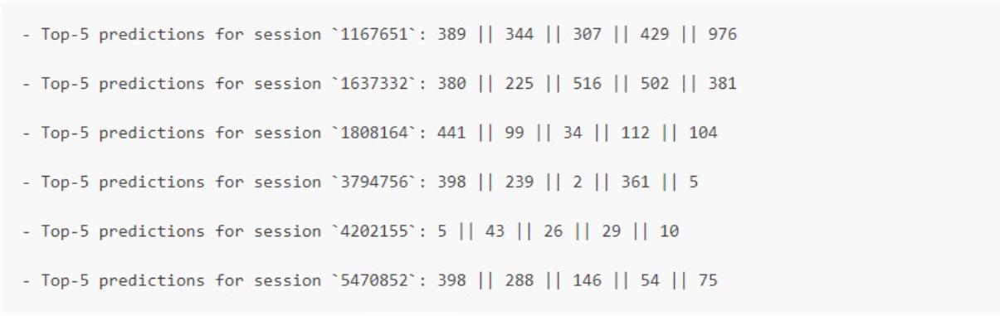